# __Machine Learning for Prioritizing Blood Pressure Genes__ 

In [1]:
import re

import numpy as np
import pandas as pd
import scipy.cluster
from numpy import absolute, mean, sort, std
from scipy.cluster import hierarchy
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.spatial.distance import pdist
from scipy.stats import spearmanr

regex = re.compile(r"\[|\]|<", re.IGNORECASE)

import matplotlib.pylab as plt
import seaborn as sns
import shap
import statsmodels.api as sm

%matplotlib inline
%config InlineBackend.figure_format ='retina'
import xgboost
from xgboost import plot_tree
from BorutaShap import BorutaShap
from matplotlib.pyplot import cm
from missingpy import MissForest
from sklearn import datasets, metrics, model_selection, preprocessing
from sklearn.metrics import (
    explained_variance_score,
    max_error,
    mean_absolute_error,
    mean_squared_error,
    r2_score,
)
from sklearn.model_selection import (
    GridSearchCV,
    KFold,
    LeaveOneOut,
    RandomizedSearchCV,
    RepeatedKFold,
    cross_val_predict,
    cross_val_score,
    cross_validate,
    learning_curve,
    train_test_split,
    validation_curve,
)
from skopt import BayesSearchCV
from skopt.plots import plot_convergence

sns.set_style("darkgrid")
sns.mpl.rcParams["figure.figsize"] = (15.0, 9.0)

import lime
import lime.lime_tabular

import eli5
from sklearn.feature_extraction.text import CountVectorizer
from eli5.sklearn import PermutationImportance
import warnings

# import dash
# import dash_core_components as dcc
# import dash_html_components as html
# import dash_table
# import matplotlib
# import matplotlib.pyplot as plt
# import plotly
# import plotly.express as px
# import plotly.figure_factory as FF
# from dash.dependencies import Input, Output
# from jupyter_dash import JupyterDash

warnings.simplefilter(action="ignore", category=FutureWarning)
from warnings import filterwarnings

filterwarnings("ignore")

seed = 0

In [2]:
data = pd.read_csv("2021-07-18_training_cleaned.csv", header=0, sep=",")

In [3]:
data["BPlabel_encoded"] = data["BPlabel"].map(
    {"most likely": 1, "probable": 0.75, "least likely": 0.1}
)
Y = data["BPlabel_encoded"]
data = data.drop(["BPlabel"], 1)
data.shape

(243, 103)

In [4]:
X = pd.read_csv("2021-07-18_imputed_training_data.csv", header=0)
X.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X.columns.values
]

In [5]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

### Load Boruta Shap Feature Selected Features

In [6]:
X_boruta_sel = pd.read_csv("2021-07-18_selected_features_training_data.csv", header=0)
X_boruta_sel.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X_boruta_sel.columns.values
]

In [7]:
df_gene = data[["Gene"]]

X_boruta_sel = pd.concat([df_gene, X_boruta_sel], axis=1)

X_boruta_sel = X_boruta_sel.set_index("Gene")

In [8]:
X_train_borsel, X_test_borsel, Y_train_borsel, Y_test_borsel = train_test_split(
    X_boruta_sel, Y, test_size=0.2, random_state=0
)

In [9]:
# Model parameters built from repeated nested CV benchmarking
xgb = xgboost.XGBRegressor(
    n_estimators=46,
    learning_rate=0.1537131375248144,
    max_depth=3,
    reg_alpha=1,
    reg_lambda=1,
    random_state=seed,
    objective="reg:squarederror",
)

### Leave One Out Cross-validation

In [10]:
cv = LeaveOneOut()
scores = cross_val_score(
    xgb, X_boruta_sel, Y, scoring="neg_mean_squared_error", cv=cv, n_jobs=-1
)
scores = absolute(scores)
print("MAE: %.3f (%.3f)" % (mean(scores), std(scores)))

MAE: 0.019 (0.045)


In [11]:
xgb.fit(X_train_borsel, Y_train_borsel)
y_true = Y
y_pred = xgb.predict(X_test_borsel)
r2 = r2_score(Y_test_borsel, y_pred)
n = X_test_borsel.shape[0]
p = X_test_borsel.shape[1]
adj_rsquared = 1 - (1 - r2) * ((n - 1) / (n - p - 1))
print("Adjusted R Squared: {}".format(adj_rsquared))

Adjusted R Squared: 0.5104911342065055


### Predicted r2 vs r2

Predicted r2:
- It removes a data point from the dataset.
- Calculates the regression equation.
- Evaluates how well the model predicts the missing observation.
- And, repeats this for all data points in the dataset.

In [12]:
xgb.fit(X_train_borsel, Y_train_borsel)
y_true = Y
y_pred = xgb.predict(X_boruta_sel)
xs = X_boruta_sel


def press_statistic(y_true, y_pred, xs):
    res = y_pred - y_true
    hat = xs.dot(np.linalg.pinv(xs))
    den = 1 - np.diagonal(hat)
    sqr = np.square(res / den)
    return sqr.sum()


def predicted_r2(y_true, y_pred, xs):
    press = press_statistic(y_true=y_true, y_pred=y_pred, xs=xs)
    sst = np.square(y_true - y_true.mean()).sum()
    return 1 - press / sst


def r2(y_true, y_pred):
    sse = np.square(y_pred - y_true).sum()
    sst = np.square(y_true - y_true.mean()).sum()
    return 1 - sse / sst


print("xgb r2:", r2(y_true, y_pred))
print("xgb Predicted r2:", predicted_r2(y_true, y_pred, xs))

xgb r2: 0.8585530477733173
xgb Predicted r2: 0.8159723701734356


### Visualize Model Performance:

In [13]:
def perform_repeated_cv(X, Y, model):
    # set random seed for repeartability
    #    random.seed(1)

    # set the number of repetitions
    n_reps = 100

    # perform repeated cross validation
    r2_scores = np.zeros(n_reps)
    mse_scores = np.zeros(n_reps)

    for u in range(n_reps):

        # randomly shuffle the dataset
        indices = np.arange(X.shape[0])
        np.random.shuffle(indices)
        X = X.iloc[indices]
        Y = Y.iloc[indices]  # dataset has been randomly shuffled

        # initialize vector to keep predictions from all folds of the cross-validation
        y_predicted = np.zeros(Y.shape)

        # perform 10-fold cross validation
        kf = KFold(n_splits=5, random_state=seed)
        for train, test in kf.split(X):

            # split the dataset into training and testing
            X_train = X.iloc[train]
            X_test = X.iloc[test]
            y_train = Y.iloc[train]
            y_test = Y.iloc[test]

            # train model
            xgb = model
            xgb.fit(X_train, y_train)

            # make predictions on the testing set
            y_predicted[test] = xgb.predict(X_test)

        # record scores
        r2_scores[u] = r2_score(Y, y_predicted)
        mse_scores[u] = mean_squared_error(Y, y_predicted)

    # return all scores
    return r2_scores, mse_scores

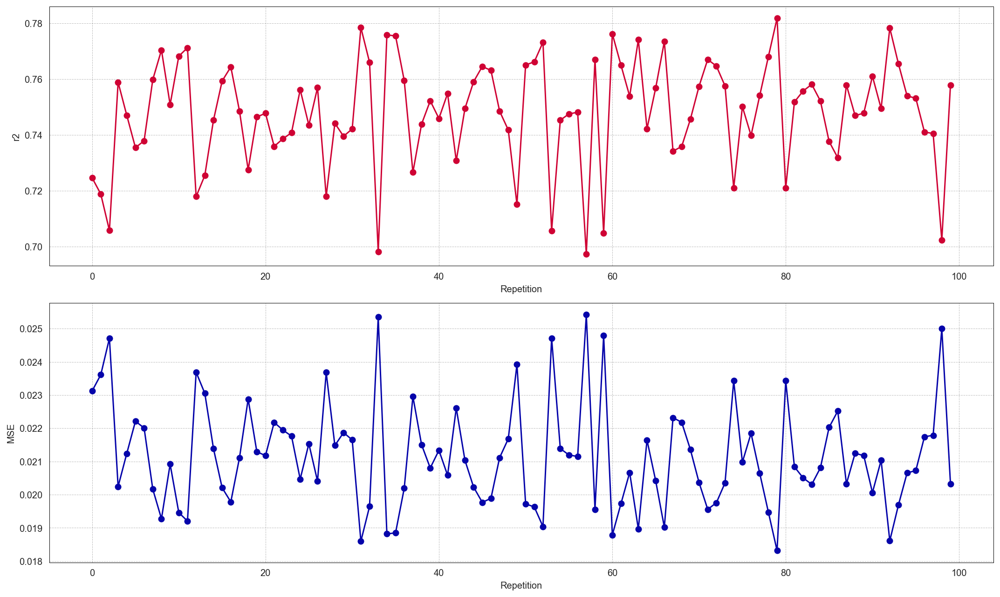

In [14]:
r2_scores, mse_scores = perform_repeated_cv(X_boruta_sel, Y, xgb)

# plot results from the 100 repetitions
fig, axes = plt.subplots(2, 1)

axes[0].plot(r2_scores, color="xkcd:cherry", marker="o")
axes[0].set_xlabel("Repetition")
axes[0].set_ylabel("r2")
axes[0].set_facecolor((1, 1, 1))
axes[0].spines["left"].set_color("black")
axes[0].spines["right"].set_color("black")
axes[0].spines["top"].set_color("black")
axes[0].spines["bottom"].set_color("black")
axes[0].spines["left"].set_linewidth(0.5)
axes[0].spines["right"].set_linewidth(0.5)
axes[0].spines["top"].set_linewidth(0.5)
axes[0].spines["bottom"].set_linewidth(0.5)
axes[0].grid(linestyle="--", linewidth="0.5", color="grey", alpha=0.5)

axes[1].plot(mse_scores, color="xkcd:royal blue", marker="o")
axes[1].set_xlabel("Repetition")
axes[1].set_ylabel("MSE")
axes[1].set_facecolor((1, 1, 1))
axes[1].spines["left"].set_color("black")
axes[1].spines["right"].set_color("black")
axes[1].spines["top"].set_color("black")
axes[1].spines["bottom"].set_color("black")
axes[1].spines["left"].set_linewidth(0.5)
axes[1].spines["right"].set_linewidth(0.5)
axes[1].spines["top"].set_linewidth(0.5)
axes[1].spines["bottom"].set_linewidth(0.5)
axes[1].grid(linestyle="--", linewidth="0.5", color="grey", alpha=0.5)


plt.grid(True)
plt.tight_layout()

### Training Data Prediction Visualization:

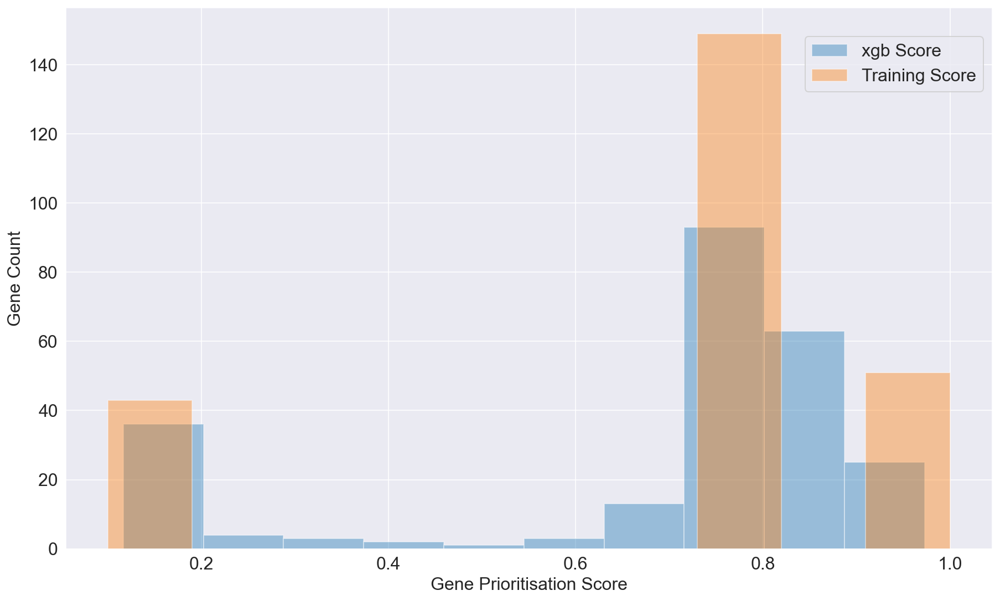

In [15]:
xgb.fit(X_train_borsel, Y_train_borsel)
predictions = list(xgb.predict(X_boruta_sel))

output = pd.Series(data=predictions, index=X_boruta_sel.index, name="xgb_Score")

df_total_training = pd.concat([X_boruta_sel, output], axis=1)

df_total = pd.concat([X_boruta_sel, output], axis=1)

fig, ax = plt.subplots()

sns.distplot(df_total["xgb_Score"], ax=ax, kde=False, norm_hist=False, bins=10)
sns.distplot(Y, ax=ax, kde=False, bins=10)
fig.legend(
    labels=["xgb Score", "Training Score"],
    loc="upper right",
    bbox_to_anchor=(0.83, 0.8),
    ncol=1,
    fontsize=16,
)
ax.set_xlabel("Gene Prioritisation Score", fontsize=16)
ax.set_ylabel("Gene Count", fontsize=16)
ax.tick_params(labelsize=16)

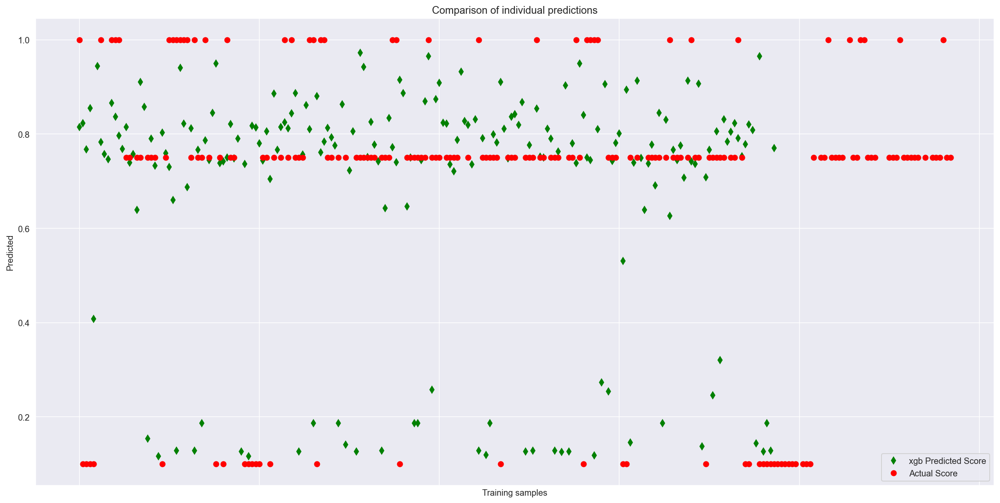

In [16]:
model1 = xgb.fit(X_train_borsel, Y_train_borsel)

model1.fit(X_train_borsel, Y_train_borsel)

xt = X_train_borsel[:243]
yt = Y_train_borsel[:243]

plt.figure(figsize=(20, 10))
plt.plot(model1.predict(xt), "gd", label="xgb Predicted Score")
plt.plot(yt, "or", label="Actual Score")
plt.tick_params(axis="x", which="both", bottom=False, top=False, labelbottom=False)
plt.ylabel("Predicted")
plt.xlabel("Training samples")
plt.legend(loc="best")
plt.title("Comparison of individual predictions")
plt.show()

In [17]:
predictions = list(xgb.predict(X_boruta_sel))

output = pd.Series(data=predictions, index=X_boruta_sel.index, name="xgb_Score")

output = output.to_frame()
output.reset_index(level=0, inplace=True)

output

,Gene,xgb_Score
0,ABCC9,0.914859
1,AC020983.5,0.126907
2,AC093677.1,0.186767
3,AC097374.4,0.186767
4,AC103563.2,0.116612
...,...,...
238,VAMP2,0.761147
239,VDR,0.777577
240,VEGFA,0.869549
241,YES1,0.787287


In [18]:
print(data[["Gene", "BPlabel_encoded"]])

df_b = data[["BPlabel_encoded"]]

df_c = pd.concat([output, df_b], axis=1)
df_c

           Gene  BPlabel_encoded
0         ABCC9             1.00
1    AC020983.5             0.10
2    AC093677.1             0.10
3    AC097374.4             0.10
4    AC103563.2             0.10
..          ...              ...
238       VAMP2             0.75
239         VDR             0.75
240       VEGFA             1.00
241        YES1             0.75
242       ZAP70             0.75

[243 rows x 2 columns]


,Gene,xgb_Score,BPlabel_encoded
0,ABCC9,0.914859,1.00
1,AC020983.5,0.126907,0.10
2,AC093677.1,0.186767,0.10
3,AC097374.4,0.186767,0.10
4,AC103563.2,0.116612,0.10
...,...,...,...
238,VAMP2,0.761147,0.75
239,VDR,0.777577,0.75
240,VEGFA,0.869549,1.00
241,YES1,0.787287,0.75


In [60]:
categorical_features = X_train_borsel[['IPA_BP_annotation']].to_numpy()
categorical_features = categorical_features.flatten()

In [61]:
train_X, test_X, train_y, test_y = train_test_split(X.values, Y.values, test_size=0.2)

In [62]:
xgb.fit(train_X, train_y)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1537131375248144, max_delta_step=0, max_depth=3,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=46, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=1, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [67]:
explainer = lime.lime_tabular.LimeTabularExplainer(train_X, feature_names=X.columns, class_names=['BPlabel_encoded'], categorical_features=categorical_features, verbose=True, mode='regression')

In [68]:
i=1
exp = explainer.explain_instance(test_X[i], xgb.predict,  num_features=8)
exp.show_in_notebook(show_table=True)

Intercept 0.6839429564561736
Prediction_local [0.80812251]
Right: 0.75470847


In [69]:
exp.as_list()

[('ExomiserScore > 0.53', 0.11541649968131473),
 ('IPA_BP_annotation=1', 0.03380300472314608),
 ('Brain_Caudate_basal_ganglia_GTExFC > 0.28', 0.03021463613886632),
 ('Muscle - Skeletal_GTExTPM > 12.39', -0.021692484128701717),
 ('Heart - Atrial Appendage_GTExTPM > 19.48', 0.021079550026648766),
 ('-0.24 < Skin_Not_Sun_Exposed_Suprapubic_GTExFC <= 0.09',
  -0.02022383867104162),
 ('Artery_Coronary_GTExFC > 0.50', -0.017610232441242074),
 ('Pituitary_GTExFC <= -0.41', -0.0168075857059228)]

In [71]:
xgb.fit(X_train_borsel, Y_train_borsel)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0, gpu_id=-1,
             importance_type='gain', interaction_constraints='',
             learning_rate=0.1537131375248144, max_delta_step=0, max_depth=3,
             min_child_weight=1, missing=nan, monotone_constraints='()',
             n_estimators=46, n_jobs=16, num_parallel_tree=1, random_state=0,
             reg_alpha=1, reg_lambda=1, scale_pos_weight=1, subsample=1,
             tree_method='exact', validate_parameters=1, verbosity=None)

In [55]:
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_borsel.iloc[:,:].values, feature_names=X.columns, class_names=['BPlabel_encoded'], 
                                                   categorical_features=categorical_features,verbose=True, mode='regression')

In [57]:
exp = explainer.explain_instance(X_train_borsel.iloc[5,:], xgb.predict, num_features=8)
exp.show_in_notebook(show_table=True)

ValueError: feature_names mismatch: ['Pituitary_GTExFC', 'Lung_GTExTPM', 'Liver_GTExTPM', 'IPA_BP_annotation', 'ExomiserScore', 'Brain_Cortex_GTExFC', 'Artery_Coronary_GTExFC', 'Colon_Sigmoid_GTExFC'] ['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7']
expected Lung_GTExTPM, Brain_Cortex_GTExFC, Artery_Coronary_GTExFC, IPA_BP_annotation, Colon_Sigmoid_GTExFC, ExomiserScore, Liver_GTExTPM, Pituitary_GTExFC in input data
training data did not have the following fields: f0, f1, f7, f3, f4, f2, f5, f6

In [ ]:
exp.as_list()

In [82]:
vec = CountVectorizer()
perm = PermutationImportance(xgb).fit(X_test_borsel, Y_test_borsel)
eli5.show_weights(perm, feature_names=list(X_boruta_sel.columns))

Weight,Feature
0.8441 ± 0.5663,ExomiserScore
0.1302 ± 0.1490,Liver_GTExTPM
0.0608 ± 0.1101,Brain_Cortex_GTExFC
0.0266 ± 0.0355,Pituitary_GTExFC
0.0244 ± 0.0250,Colon_Sigmoid_GTExFC
0.0193 ± 0.0253,Lung_GTExTPM
0.0161 ± 0.1310,Artery_Coronary_GTExFC
-0.0023 ± 0.1109,IPA_BP_annotation


In [114]:
eli5.explain_weights(xgb)

Weight,Feature
0.5245,ExomiserScore
0.1479,IPA_BP_annotation
0.0887,Brain_Cortex_GTExFC
0.0836,Artery_Coronary_GTExFC
0.0820,Lung_GTExTPM
0.0372,Liver_GTExTPM
0.0187,Colon_Sigmoid_GTExFC
0.0173,Pituitary_GTExFC


In [119]:
eli5.explain_prediction(xgb, X_test_borsel.iloc[1].values)

ValueError: feature_names mismatch: ['Pituitary_GTExFC', 'Lung_GTExTPM', 'Liver_GTExTPM', 'IPA_BP_annotation', 'ExomiserScore', 'Brain_Cortex_GTExFC', 'Artery_Coronary_GTExFC', 'Colon_Sigmoid_GTExFC'] ['f0', 'f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7']
expected Lung_GTExTPM, Brain_Cortex_GTExFC, Artery_Coronary_GTExFC, IPA_BP_annotation, Colon_Sigmoid_GTExFC, ExomiserScore, Liver_GTExTPM, Pituitary_GTExFC in input data
training data did not have the following fields: f0, f1, f7, f3, f4, f2, f5, f6

In [120]:
eli5.show_weights(xgb, feature_names=list(X_boruta_sel.columns),
             show=["decision_tree", "method", "description"])

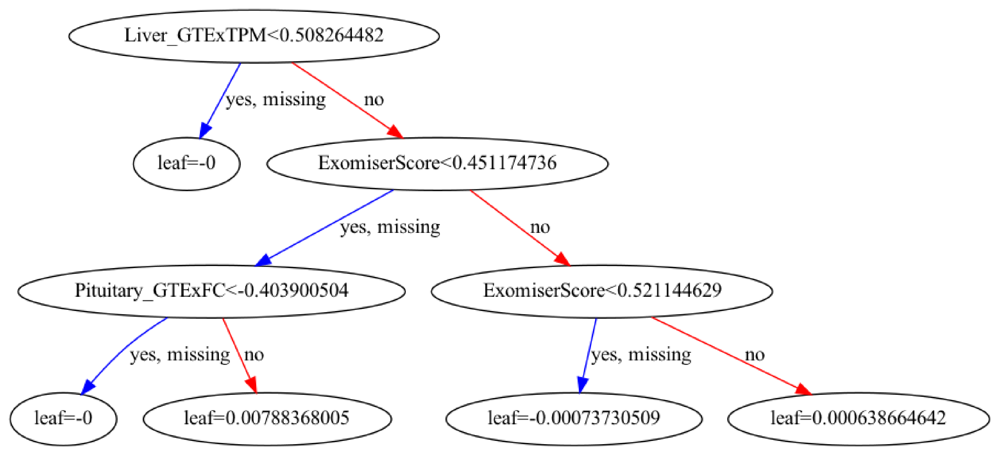

In [102]:
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(xgb, num_trees = 39, ax=ax)
plt.show()

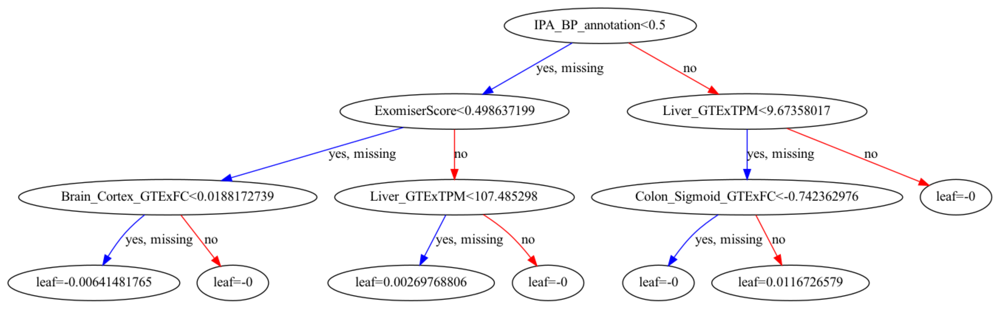

In [109]:
fig, ax = plt.subplots(figsize=(30, 30))
plot_tree(xgb, num_trees = 15, ax=ax)
plt.show()

In [110]:
#The leaf value is the prediction of that tree for the given data point. 
#The final prediction for that data point will be sum of leaf values in all the trees for that point.

### SHAP Feature Importance Visualization:

In [10]:
xgb.fit(X_train_borsel, Y_train_borsel)
df3 = pd.DataFrame(data=X_boruta_sel, columns=X_boruta_sel.columns)
df3.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X_boruta_sel.columns.values
]
X_importance = X_test_borsel
explainer = shap.TreeExplainer(xgb)
shap_values = explainer.shap_values(X_importance)
X_importance = pd.DataFrame(data=X_test_borsel, columns=df3.columns)

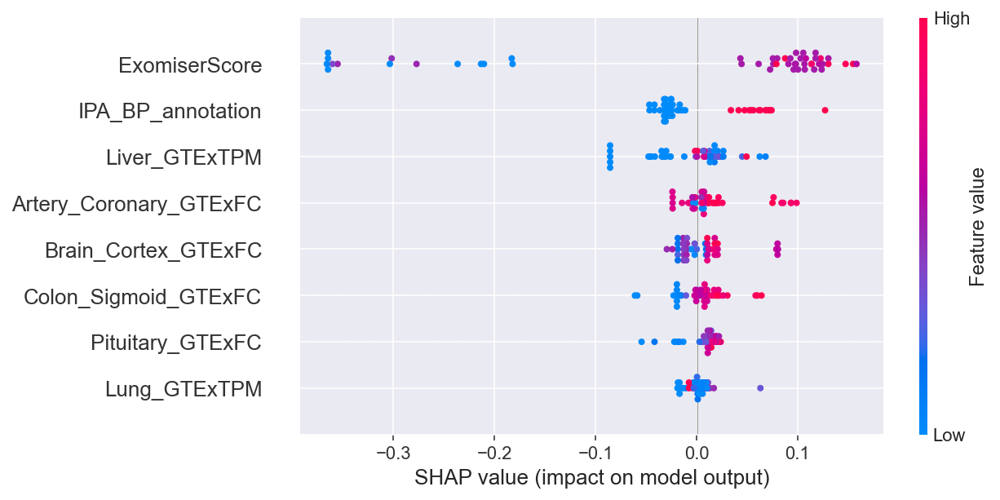

In [10]:
shap.summary_plot(shap_values, X_importance)

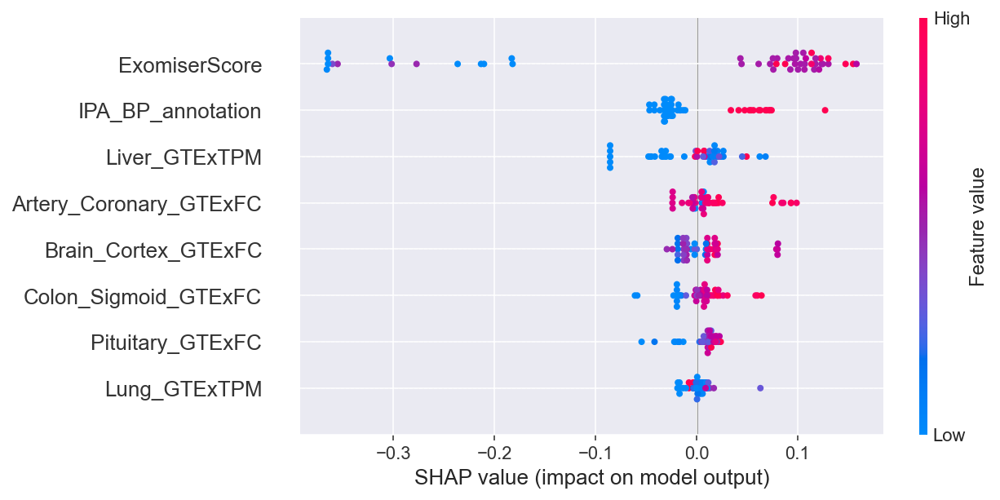

In [11]:
fig, ax = plt.subplots()
shap.summary_plot(shap_values, X_importance)
fig.savefig('shap_summary.svg', format='svg', dpi=1200, bbox_inches = "tight")

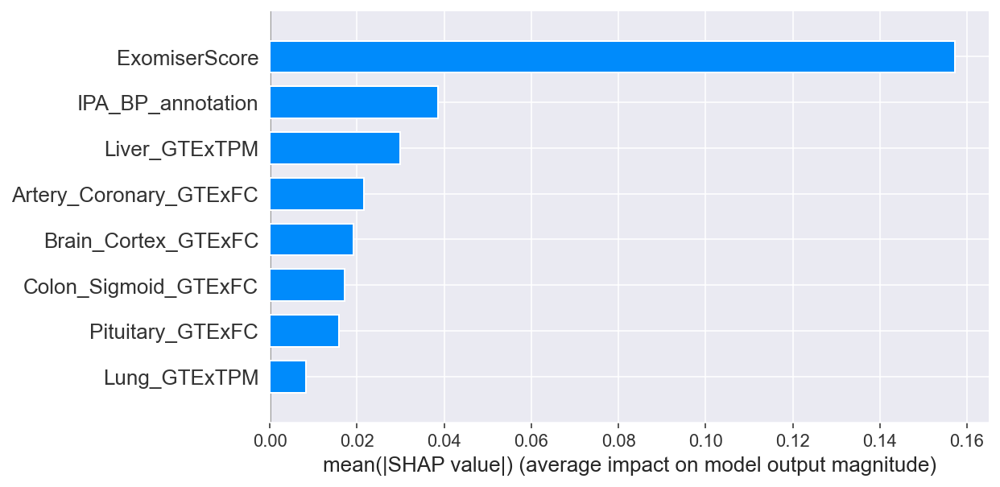

In [12]:
shap.summary_plot(shap_values, X_importance, plot_type="bar")

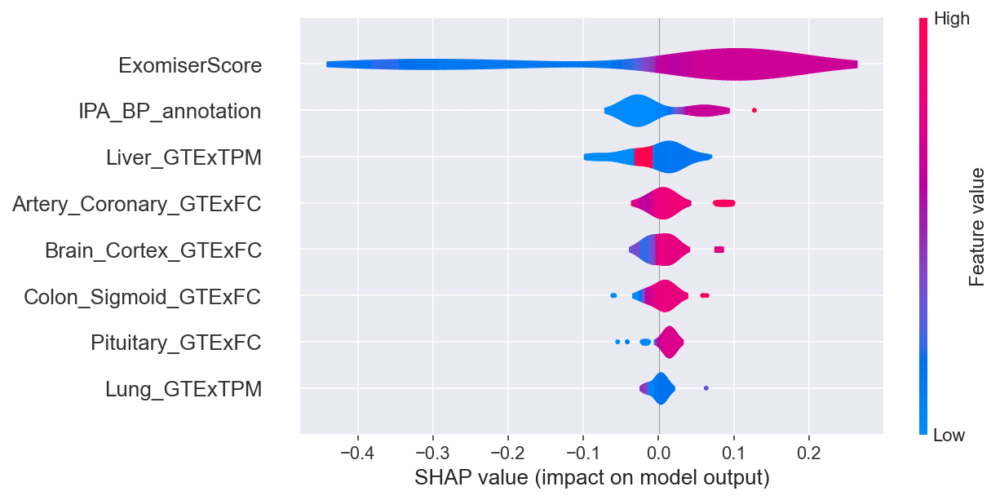

In [13]:
shap.summary_plot(shap_values, X_importance, plot_type="violin", color="coolwarm")

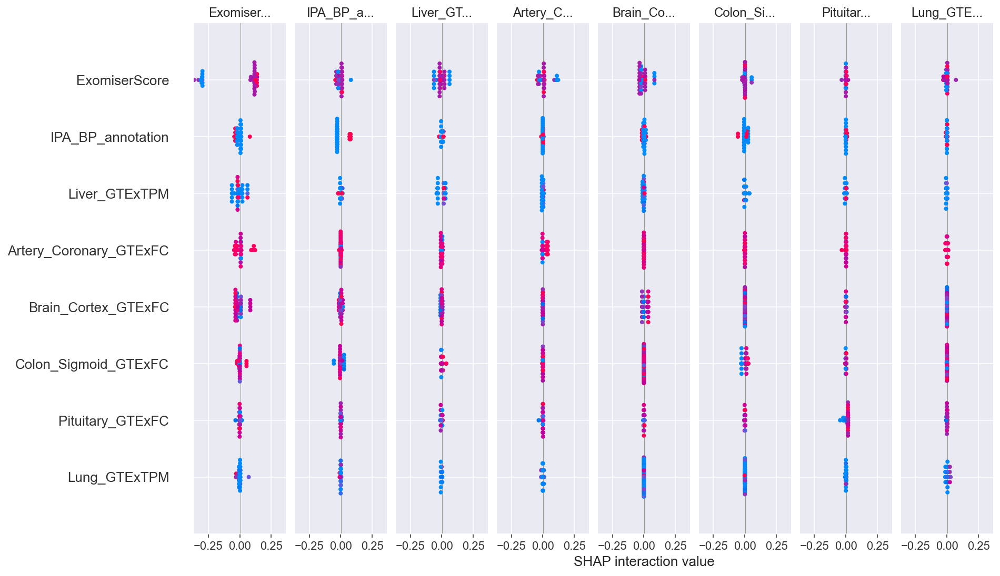

In [14]:
X_interaction = X_test_borsel
shap_interaction_values = shap.TreeExplainer(xgb).shap_interaction_values(X_interaction)
X_interaction2 = pd.DataFrame(data=X_interaction, columns=df3.columns)
shap.summary_plot(shap_interaction_values, X_interaction2, max_display=11)

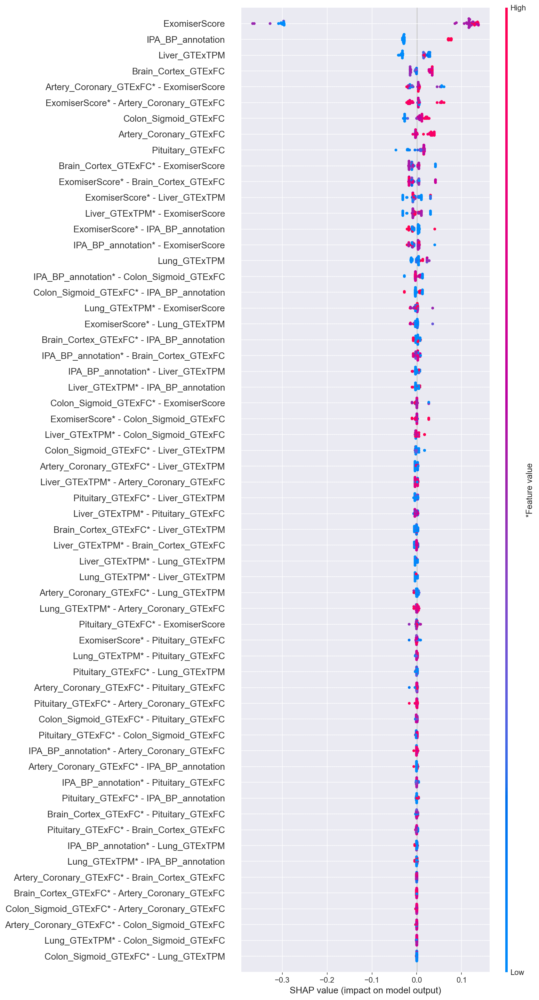

In [15]:
shap.summary_plot(
    shap_interaction_values, X_interaction2, max_display=60, plot_type="compact_dot"
)

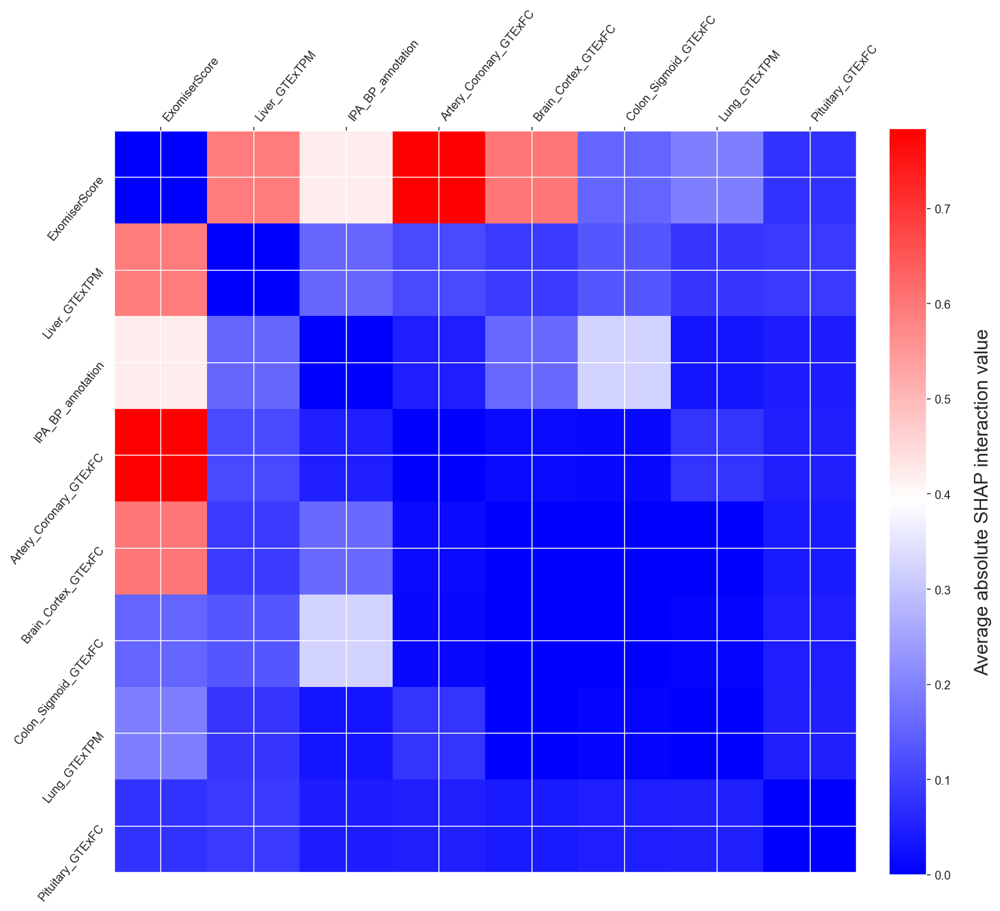

In [16]:
tmp = np.abs(shap_interaction_values).sum(0)
for i in range(tmp.shape[0]):
    tmp[i, i] = 0
inds = np.argsort(-tmp.sum(0))[:50]
tmp2 = tmp[inds, :][:, inds]


f = plt.figure(figsize=(12, 12))
plt.imshow(
    tmp2, cmap="bwr"
)  # https://matplotlib.org/stable/gallery/color/colormap_reference.html
plt.yticks(
    range(tmp2.shape[0]),
    X_interaction.columns[inds],
    rotation=50.4,
    horizontalalignment="right",
)
plt.xticks(
    range(tmp2.shape[0]),
    X_interaction.columns[inds],
    rotation=50.4,
    horizontalalignment="left",
)
plt.gca().xaxis.tick_top()
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label("Average absolute SHAP interaction value", size=16, labelpad=20)
plt.rcParams.update({"font.size": 16})
plt.tight_layout()
f.savefig("shap_interactions.svg", format='svg', dpi=1200)


#plt.show()


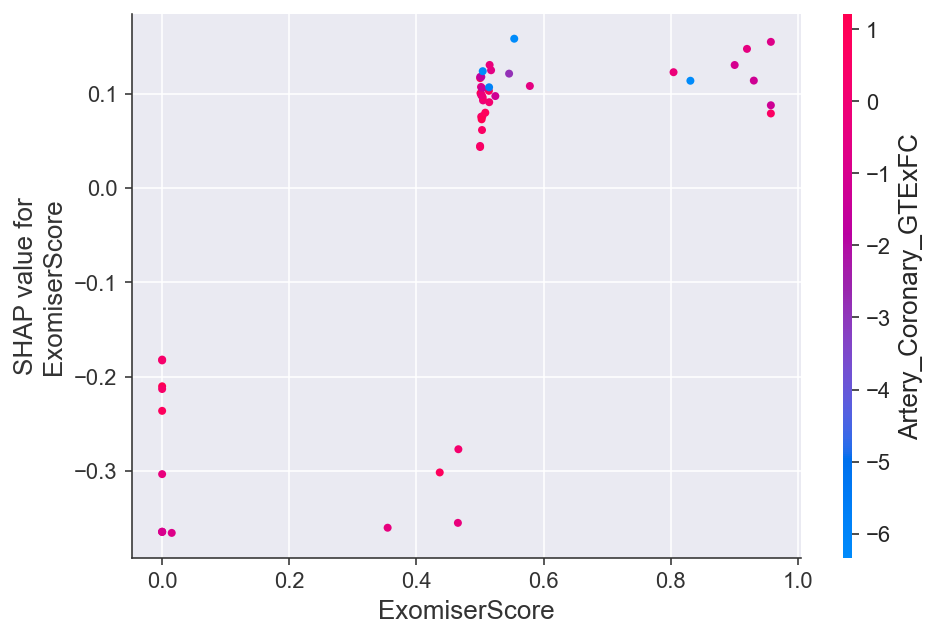

In [17]:
shap.dependence_plot(
    "ExomiserScore", shap_values, X_importance, interaction_index="Artery_Coronary_GTExFC"
)

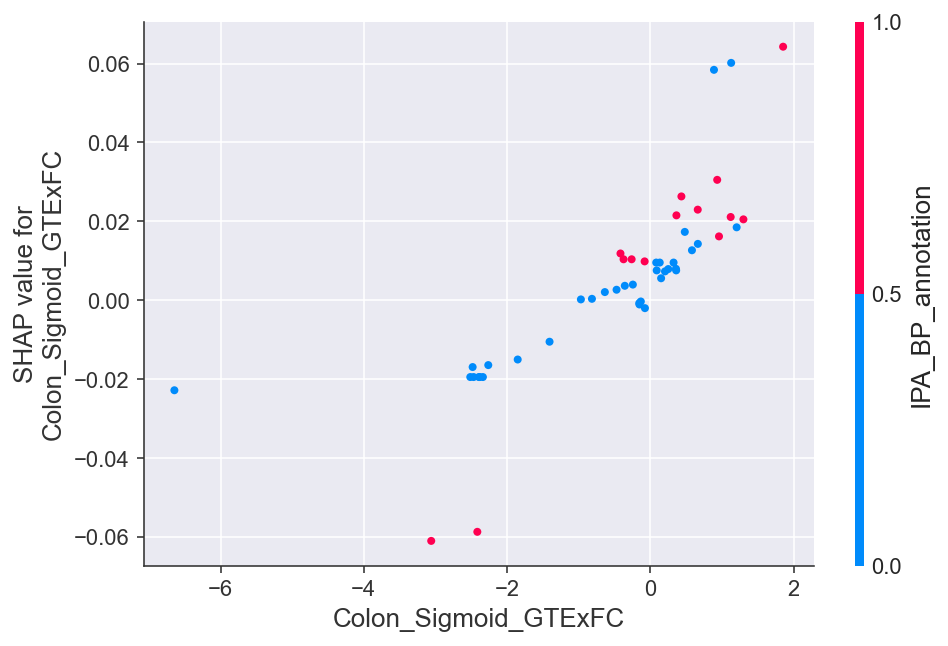

In [18]:
shap.dependence_plot(
    "Colon_Sigmoid_GTExFC", shap_values, X_importance, interaction_index="IPA_BP_annotation"
)

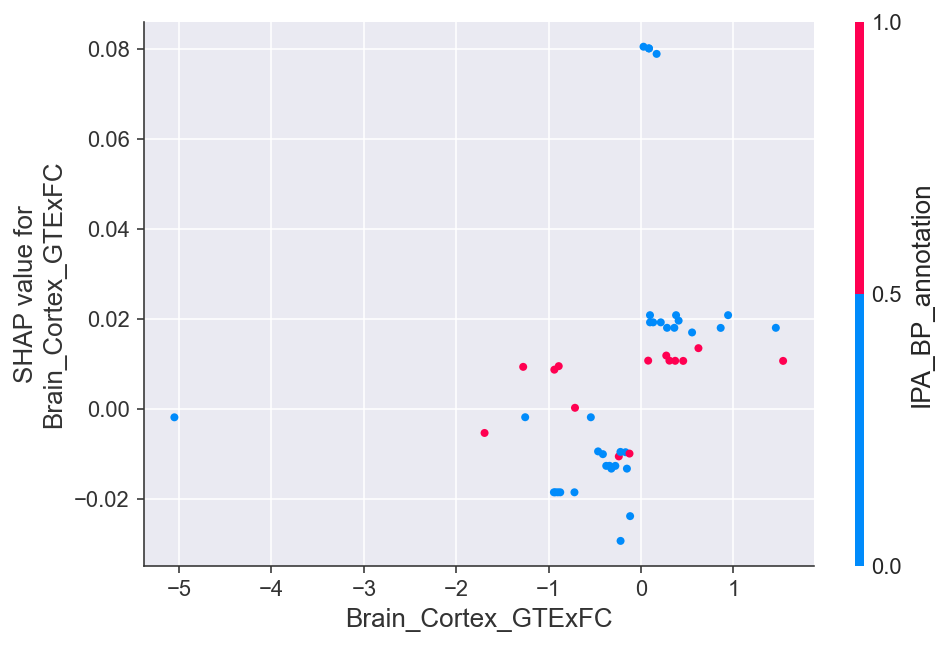

In [19]:
shap.dependence_plot(
    "Brain_Cortex_GTExFC", shap_values, X_importance, interaction_index="IPA_BP_annotation"
)

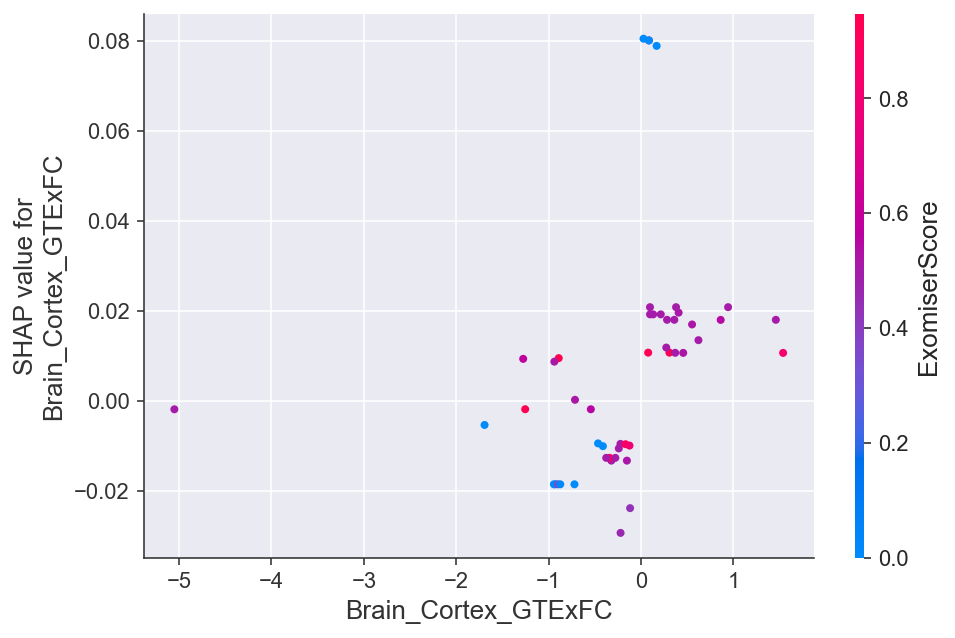

In [20]:
shap.dependence_plot(
    "Brain_Cortex_GTExFC", shap_values, X_importance, interaction_index="ExomiserScore"
)

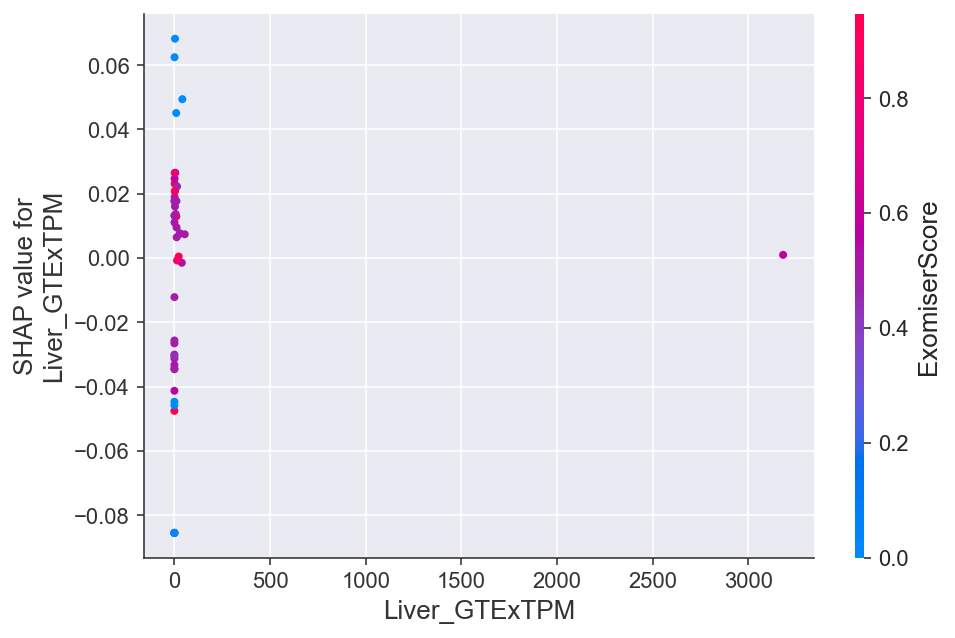

In [21]:
shap.dependence_plot(
    "Liver_GTExTPM", shap_values, X_importance, interaction_index="ExomiserScore"
)

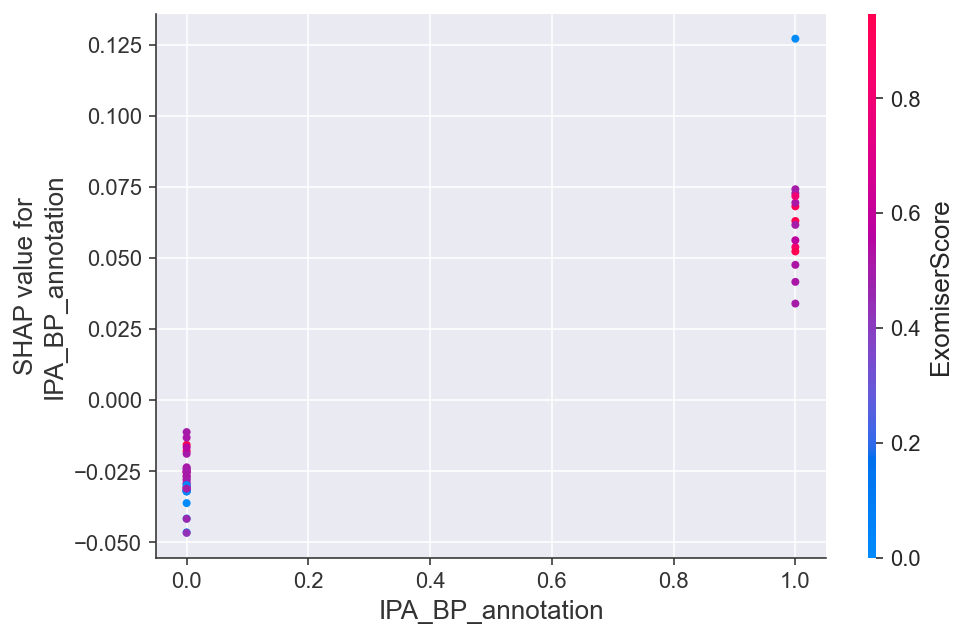

In [22]:
shap.dependence_plot(
    "IPA_BP_annotation", shap_values, X_importance, interaction_index="ExomiserScore"
)

In [3]:
expected_value = explainer.expected_value

if isinstance(expected_value, list):
    expected_value = expected_value[1]
print(f"Explainer expected value: {expected_value}")

select = range(8)
features = X_test_borsel.iloc[select]


with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    shap_values = explainer.shap_values(features)[1]
    shap_interaction_values = explainer.shap_interaction_values(features)
if isinstance(shap_interaction_values, list):
    shap_interaction_values = shap_interaction_values[1]

NameError: name 'explainer' is not defined

In [2]:
# https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/heatmap.html

shap_values = explainer(X_boruta_sel)
fig, ax = plt.subplots()
shap.plots.heatmap(shap_values)
fig.savefig('shap_heatmap.svg', format='svg', dpi=1200, bbox_inches = "tight")

NameError: name 'explainer' is not defined

In [12]:
select = range(8)
features = X_boruta_sel.iloc[select]
features_display = X_boruta_sel.loc[features.index]
shap_values = explainer.shap_values(X_boruta_sel)


In [26]:
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[:243, :],
    X_boruta_sel.iloc[:243, :],
    features_display,
)

In [27]:
output_of_force_plot = shap.force_plot(
    explainer.expected_value,
    shap_values[:243, :],
    X_boruta_sel.iloc[:243, :],
    features_display,
    show=False,
)
file = "force_plot_pval07.html"
shap.save_html(file, output_of_force_plot)

### SHAP average measures per gene and per feature:

In [28]:
explainer = shap.Explainer(xgb, X_boruta_sel)
shap_values2 = explainer.shap_values(X_boruta_sel)
features = X_boruta_sel.columns.values.tolist()

shapdf = pd.DataFrame(data=np.array(shap_values2), columns=features)
shapdf["shap_average"] = shapdf.mean(axis=1)
shapdf

,Pituitary_GTExFC,Lung_GTExTPM,Liver_GTExTPM,IPA_BP_annotation,ExomiserScore,Brain_Cortex_GTExFC,Artery_Coronary_GTExFC,Colon_Sigmoid_GTExFC,shap_average
0,0.017438,0.004271,0.025019,0.074230,0.088905,0.009543,0.018694,0.025308,0.032926
1,0.012085,-0.018575,-0.082806,-0.025253,-0.308894,-0.031089,-0.043553,-0.026456,-0.065568
2,0.002454,-0.010039,0.027533,-0.032433,-0.352806,-0.044393,-0.049140,-0.005860,-0.058085
3,0.002454,-0.010039,0.023589,-0.032314,-0.349141,-0.044393,-0.049140,-0.005700,-0.058085
4,-0.017668,-0.016791,-0.076552,-0.025475,-0.315713,-0.026157,-0.033603,-0.022878,-0.066855
...,...,...,...,...,...,...,...,...,...
238,0.004057,0.006812,0.021153,-0.017421,0.115577,-0.017224,-0.009034,0.005776,0.013712
239,-0.062081,0.004679,-0.013558,0.064375,0.116170,-0.001346,0.009476,0.008413,0.015766
240,-0.008628,0.008042,0.018660,0.068534,0.102264,0.008749,0.013260,0.007219,0.027262
241,0.005593,-0.000872,0.018729,-0.015668,0.090999,0.018379,0.012451,0.006226,0.016980


In [33]:
df_d = pd.concat([df_c, shapdf], axis=1)
df_d.to_csv("2021-07-18_training_features_shapavg.csv", index=False)
df_d

,Gene,xgb_Score,BPlabel_encoded,Pituitary_GTExFC,Lung_GTExTPM,Liver_GTExTPM,IPA_BP_annotation,ExomiserScore,Brain_Cortex_GTExFC,Artery_Coronary_GTExFC,Colon_Sigmoid_GTExFC,shap_average
0,ABCC9,0.914859,1.00,0.017438,0.004271,0.025019,0.074230,0.088905,0.009543,0.018694,0.025308,0.032926
1,AC020983.5,0.126907,0.10,0.012085,-0.018575,-0.082806,-0.025253,-0.308894,-0.031089,-0.043553,-0.026456,-0.065568
2,AC093677.1,0.186767,0.10,0.002454,-0.010039,0.027533,-0.032433,-0.352806,-0.044393,-0.049140,-0.005860,-0.058085
3,AC097374.4,0.186767,0.10,0.002454,-0.010039,0.023589,-0.032314,-0.349141,-0.044393,-0.049140,-0.005700,-0.058085
4,AC103563.2,0.116612,0.10,-0.017668,-0.016791,-0.076552,-0.025475,-0.315713,-0.026157,-0.033603,-0.022878,-0.066855
...,...,...,...,...,...,...,...,...,...,...,...,...
238,VAMP2,0.761147,0.75,0.004057,0.006812,0.021153,-0.017421,0.115577,-0.017224,-0.009034,0.005776,0.013712
239,VDR,0.777577,0.75,-0.062081,0.004679,-0.013558,0.064375,0.116170,-0.001346,0.009476,0.008413,0.015766
240,VEGFA,0.869549,1.00,-0.008628,0.008042,0.018660,0.068534,0.102264,0.008749,0.013260,0.007219,0.027262
241,YES1,0.787287,0.75,0.005593,-0.000872,0.018729,-0.015668,0.090999,0.018379,0.012451,0.006226,0.016980


In [34]:
df_e = df_d[["Gene", "xgb_Score", "shap_average", "BPlabel_encoded"]]
df_e.to_csv("2021-07-18_training_genes_shapavg.csv", index=False)
df_e

,Gene,xgb_Score,shap_average,BPlabel_encoded
0,ABCC9,0.914859,0.032926,1.00
1,AC020983.5,0.126907,-0.065568,0.10
2,AC093677.1,0.186767,-0.058085,0.10
3,AC097374.4,0.186767,-0.058085,0.10
4,AC103563.2,0.116612,-0.066855,0.10
...,...,...,...,...
238,VAMP2,0.761147,0.013712,0.75
239,VDR,0.777577,0.015766,0.75
240,VEGFA,0.869549,0.027262,1.00
241,YES1,0.787287,0.016980,0.75


## Decision Plots:
- The plot is centered on the x-axis at explainer.expected_value. All SHAP values are relative to the model's expected value like a linear model's effects are relative to the intercept.
- The y-axis lists the model's features. By default, the features are ordered by descending importance. The importance is calculated over the observations plotted. _This is usually different than the importance ordering for the entire dataset._ In addition to feature importance ordering, the decision plot also supports hierarchical cluster feature ordering and user-defined feature ordering.
- Each observation's prediction is represented by a colored line. At the top of the plot, each line strikes the x-axis at its corresponding observation's predicted value. This value determines the color of the line on a spectrum.
- Moving from the bottom of the plot to the top, SHAP values for each feature are added to the model's base value. This shows how each feature contributes to the overall prediction.
- At the bottom of the plot, the observations converge at explainer.expected_value.

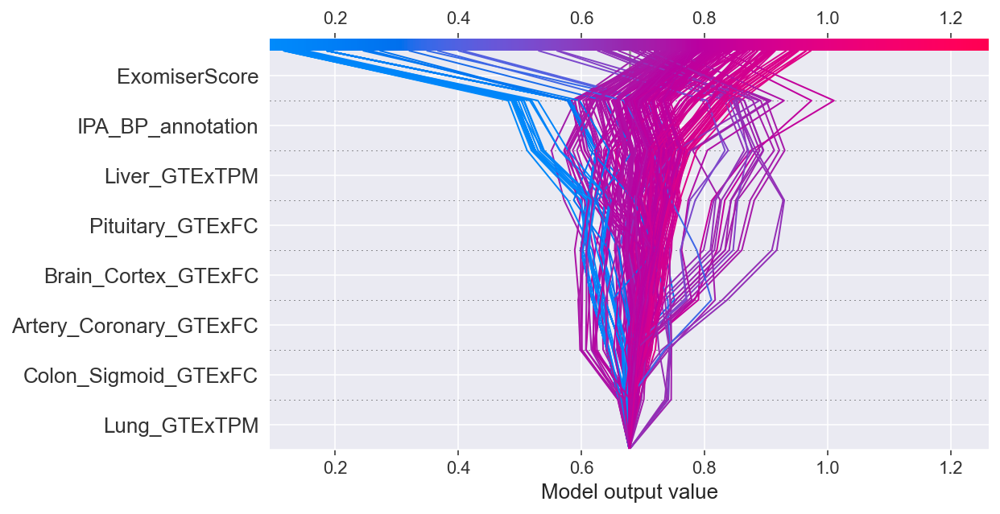

In [13]:
shap.decision_plot(
    expected_value,
    explainer.shap_values(X_boruta_sel),
    features_display,
    ignore_warnings=True,
)

In [14]:
X_boruta_sel = pd.read_csv("2021-07-18_selected_features_training_data.csv", header=0)
X_boruta_sel.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X_boruta_sel.columns.values
]

In [15]:
y_pred = xgb.predict(X_boruta_sel)

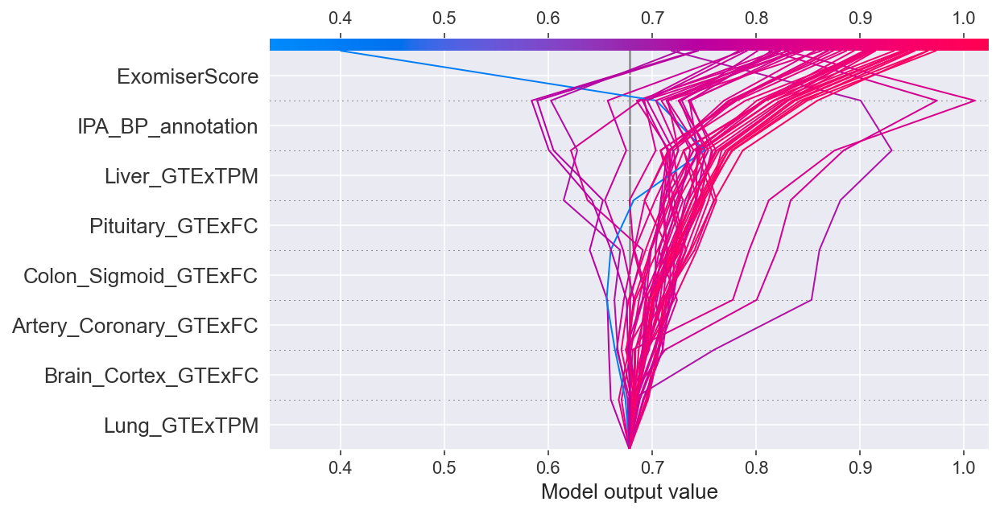

In [16]:
T = X_boruta_sel
T = T[(Y == 1)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)

fig, ax = plt.subplots()
shap.decision_plot(expected_value, sh, T, return_objects=True)
fig.savefig('shap_51genes.svg', format='svg', dpi=1200, bbox_inches = "tight")


In [17]:
y_pred = xgb.predict(X_boruta_sel)
T = X_boruta_sel[(y_pred <= 0.6)]
T = T[(Y == 1)]
T.shape

(1, 8)

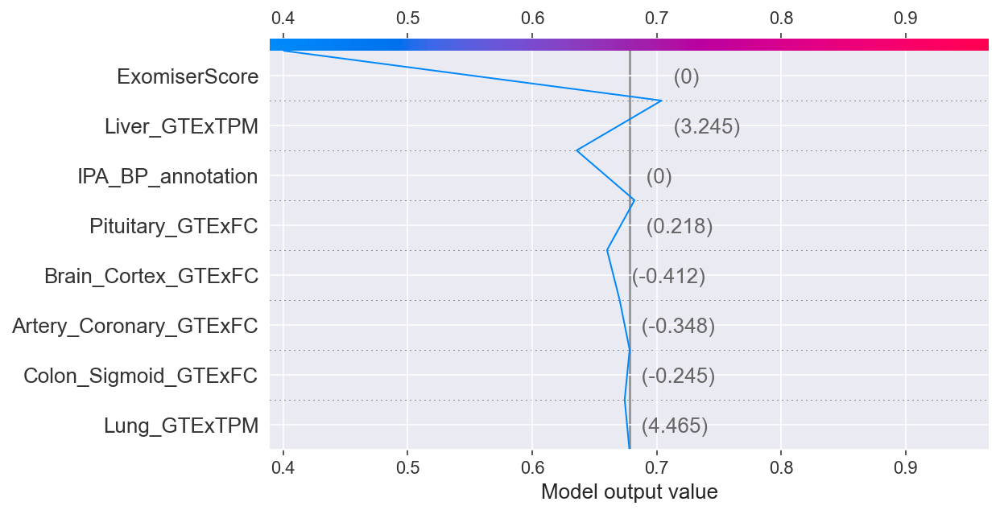

In [18]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)

r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [19]:
print(T)

    Pituitary_GTExFC  Lung_GTExTPM  Liver_GTExTPM  IPA_BP_annotation  \
90          0.218075       4.46479        3.24452                  0   

    ExomiserScore  Brain_Cortex_GTExFC  Artery_Coronary_GTExFC  \
90            0.0            -0.412119               -0.347885   

    Colon_Sigmoid_GTExFC  
90             -0.244719  


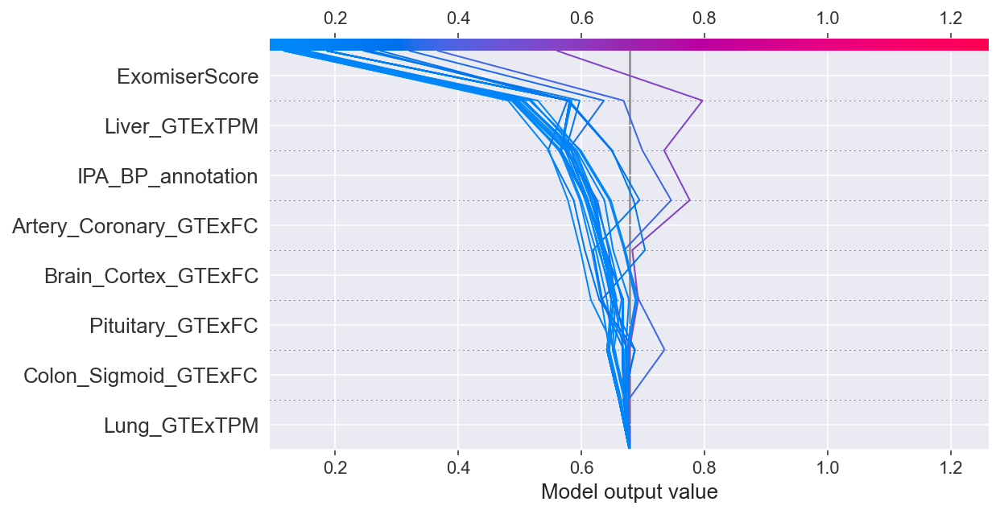

In [20]:
y_pred = xgb.predict(X_boruta_sel)
T = X_boruta_sel
T = T[(Y == 0.1)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

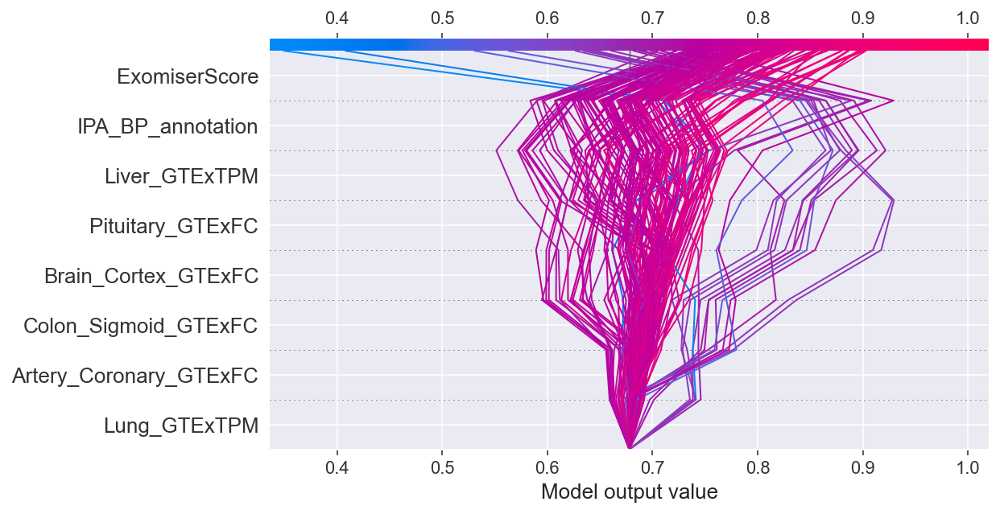

In [21]:
y_pred = xgb.predict(X_boruta_sel)
T = X_boruta_sel
T = T[(Y == 0.75)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

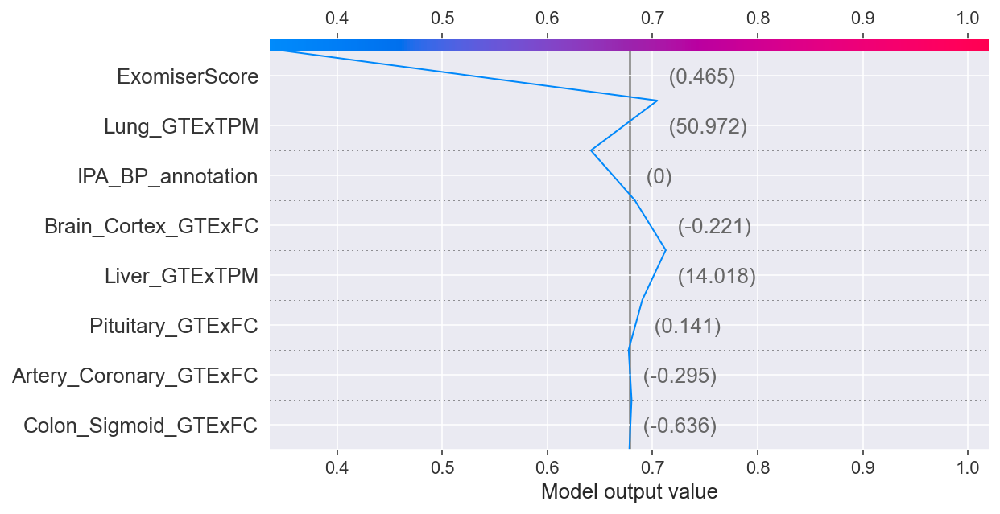

In [22]:
T = X_boruta_sel[(y_pred <= 0.4)]
T = T[(Y == 0.75)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

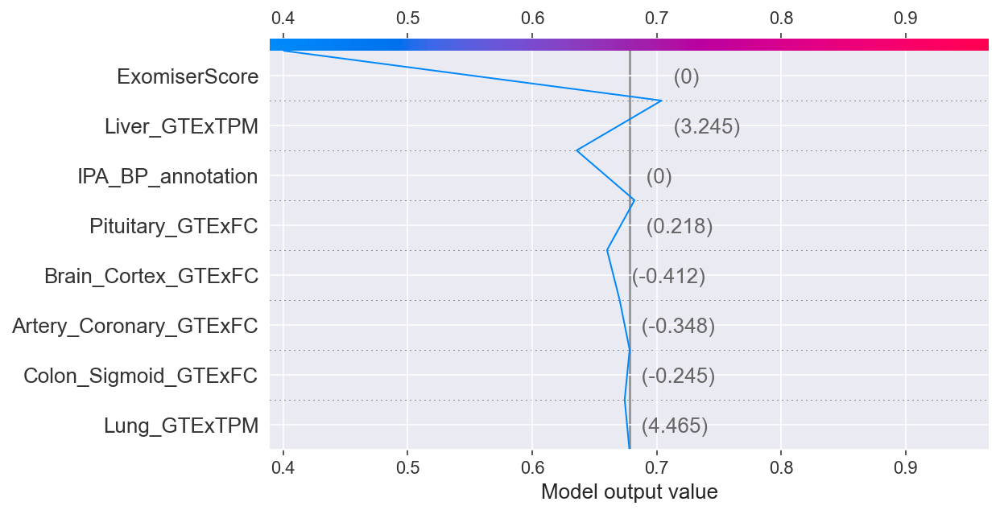

In [23]:
T = X_boruta_sel[(y_pred <= 0.5)]
T = T[(Y == 1)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [24]:
print(T)

    Pituitary_GTExFC  Lung_GTExTPM  Liver_GTExTPM  IPA_BP_annotation  \
90          0.218075       4.46479        3.24452                  0   

    ExomiserScore  Brain_Cortex_GTExFC  Artery_Coronary_GTExFC  \
90            0.0            -0.412119               -0.347885   

    Colon_Sigmoid_GTExFC  
90             -0.244719  


In [25]:
X_boruta_sel = pd.read_csv("2021-07-18_selected_features_training_data.csv", header=0)
X_boruta_sel.columns = [
    regex.sub("_", col) if any(x in str(col) for x in set(("[", "]", "<"))) else col
    for col in X_boruta_sel.columns.values
]
df_gene = data[["Gene"]]

X_boruta_sel = pd.concat([df_gene, X_boruta_sel], axis=1)

X_boruta_sel = X_boruta_sel.set_index("Gene")

X_boruta_sel.iloc[65]

Pituitary_GTExFC            -0.402815
Lung_GTExTPM              1325.710000
Liver_GTExTPM              422.046000
IPA_BP_annotation            1.000000
ExomiserScore                0.913255
Brain_Cortex_GTExFC         -3.749093
Artery_Coronary_GTExFC       0.529133
Colon_Sigmoid_GTExFC         0.671661
Name: DUSP1, dtype: float64

In [26]:
X_boruta_sel.iloc[[90], :]

,Pituitary_GTExFC,Lung_GTExTPM,Liver_GTExTPM,IPA_BP_annotation,ExomiserScore,Brain_Cortex_GTExFC,Artery_Coronary_GTExFC,Colon_Sigmoid_GTExFC
Gene,,,,,,,,
HFE,0.218075,4.46479,3.24452,0,0.0,-0.412119,-0.347885,-0.244719


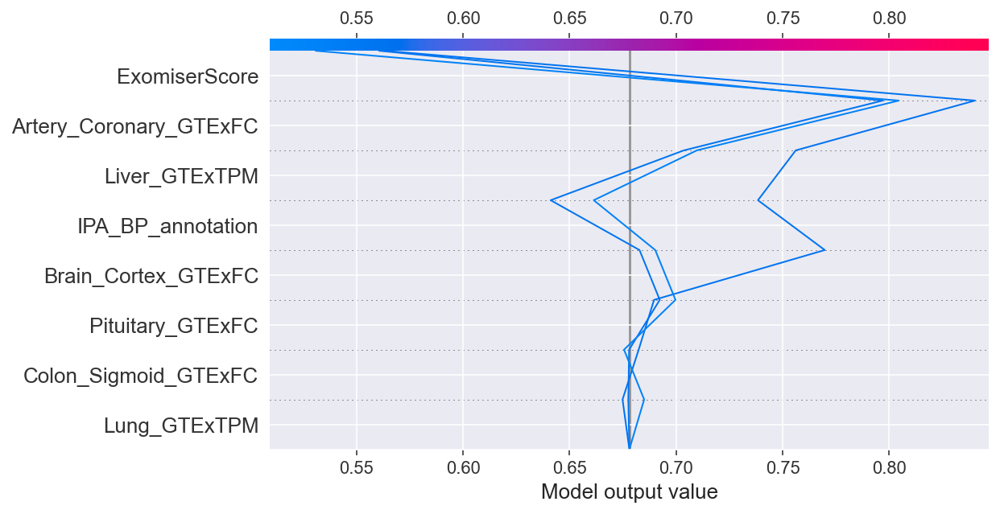

In [27]:
y_pred = xgb.predict(X_boruta_sel)

T = X_boruta_sel[(y_pred >= 0.5) & (y_pred <= 0.6)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [28]:
predictions = list(xgb.predict(X_boruta_sel))

output = pd.Series(data=predictions, index=X_boruta_sel.index, name="xgb_Score")

output = output.to_frame()
output.reset_index(level=0, inplace=True)

output

df_b = data[["BPlabel_encoded"]]

df_c = pd.concat([output, df_b], axis=1)
df_c

,Gene,xgb_Score,BPlabel_encoded
0,ABCC9,0.914859,1.00
1,AC020983.5,0.126907,0.10
2,AC093677.1,0.186767,0.10
3,AC097374.4,0.186767,0.10
4,AC103563.2,0.116612,0.10
...,...,...,...
238,VAMP2,0.761147,0.75
239,VDR,0.777577,0.75
240,VEGFA,0.869549,1.00
241,YES1,0.787287,0.75


In [29]:
list(X_boruta_sel.index).index("ACBD4")

5

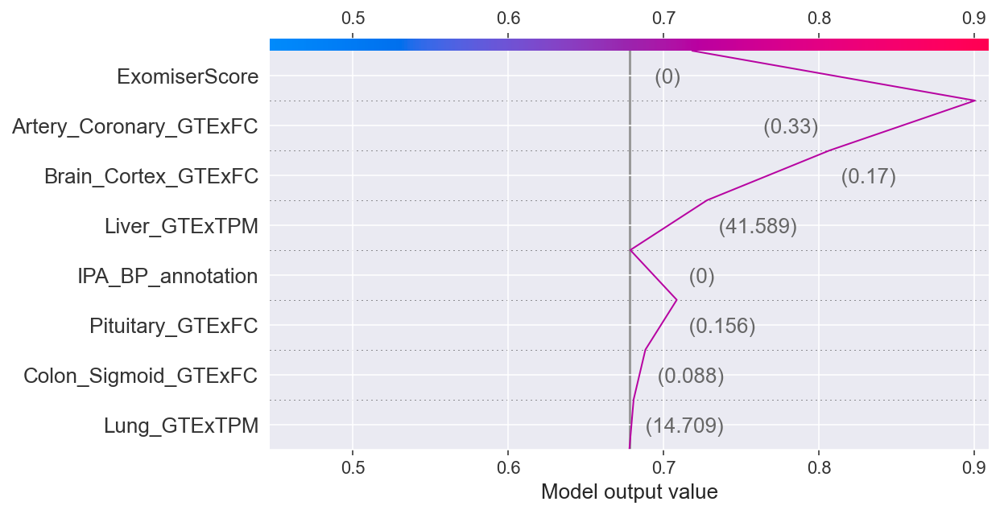

In [31]:
#ACBD4
shap.decision_plot(
    expected_value,
    explainer.shap_values(X_boruta_sel.iloc[[5]]),
    X_boruta_sel.iloc[5],
    list(features_display,),
    return_objects=True
)

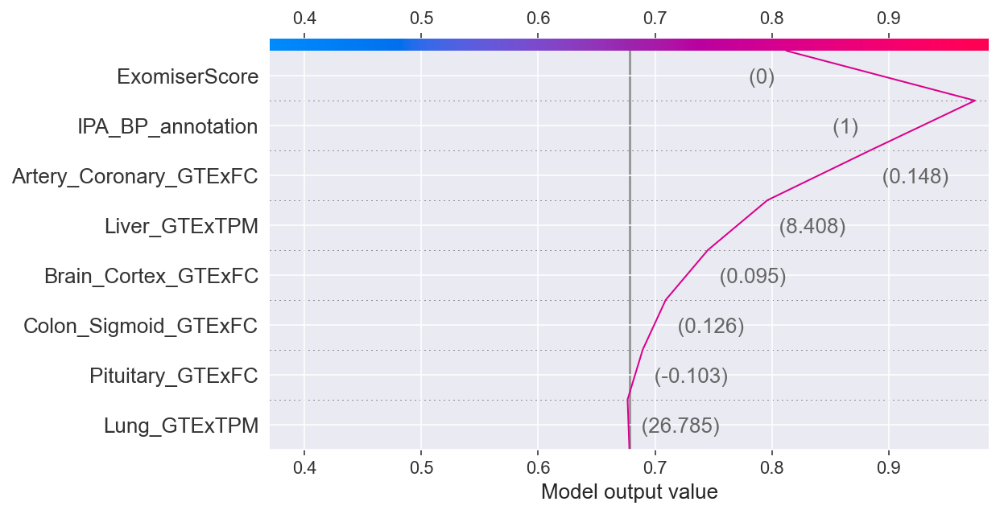

In [32]:
shap.decision_plot(
    expected_value,
    explainer.shap_values(X_boruta_sel.iloc[[41]]),
    X_boruta_sel.iloc[41],
    list(features_display),
)
#CLCN6

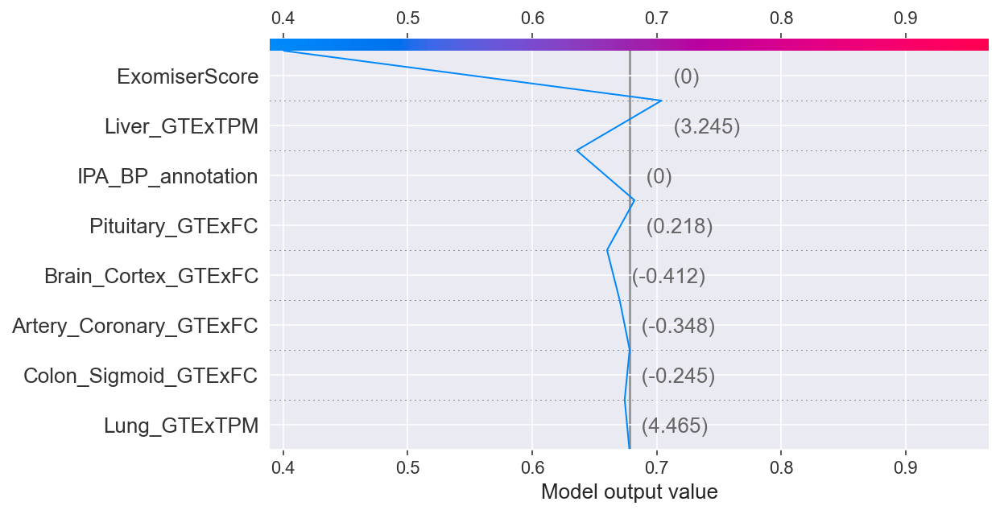

In [34]:
#HFE
shap.decision_plot(
    expected_value,
    explainer.shap_values(X_boruta_sel.iloc[[90]]),
    X_boruta_sel.iloc[90],
    list(features_display),
)

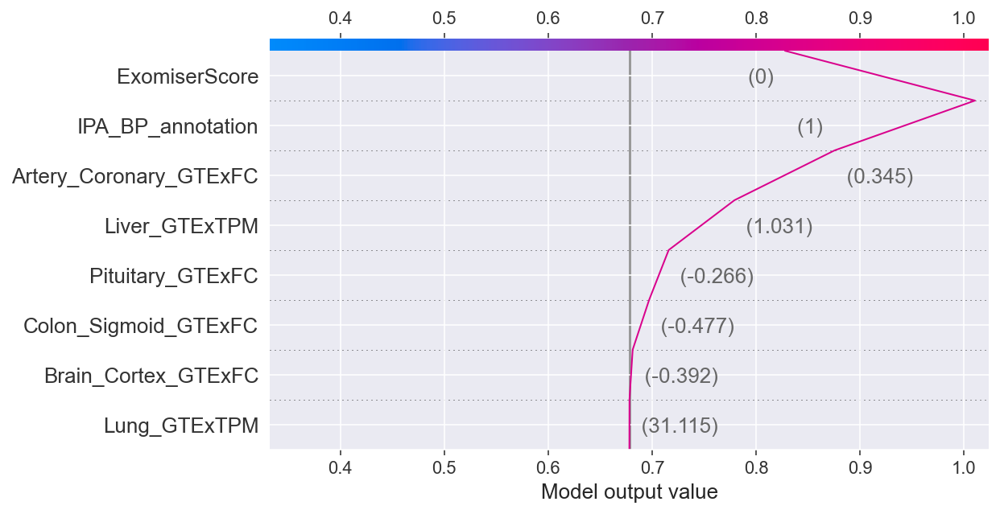

In [35]:
#EDNRA
shap.decision_plot(
    expected_value,
    explainer.shap_values(X_boruta_sel.iloc[[68]]),
    X_boruta_sel.iloc[68],
    list(features_display),
)

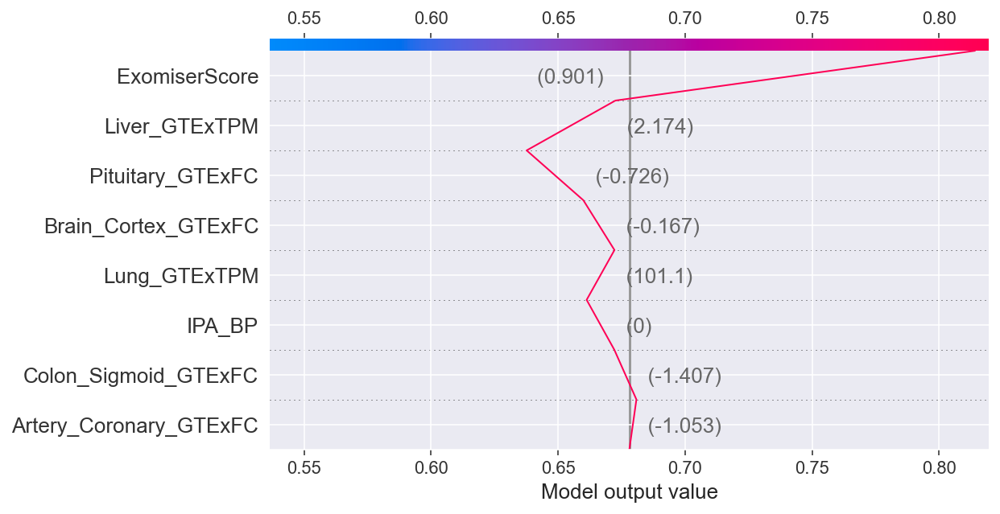

In [55]:
shap.decision_plot(
    expected_value,
    explainer.shap_values(X_boruta_sel.iloc[83]),
    X_boruta_sel.iloc[83],
    list(features_display),
)

## Decison Plots of Genes with no exomiser score

In [56]:
XY = X_boruta_sel
XY = XY.reset_index()
Y2 = Y.to_frame()
XY["Training_Score"] = Y2["BPlabel_encoded"]
lowEx = XY.loc[XY["ExomiserScore"] == 0]
lowEx

,Gene,Pituitary_GTExFC,Lung_GTExTPM,Liver_GTExTPM,IPA_BP,ExomiserScore,Brain_Cortex_GTExFC,Artery_Coronary_GTExFC,Colon_Sigmoid_GTExFC,Training_Score
5,ACBD4,0.155903,14.709300,41.588600,0.0,0.0,0.169534,0.329856,0.088092,1.00
7,ACTG1P3,-0.218870,2.541570,0.983033,0.0,0.0,-0.464271,0.824622,-0.815827,0.10
22,BDNF,-0.331336,1.171760,0.043415,1.0,0.0,-1.693179,1.946759,1.852603,0.75
23,BTF3L4P2,-0.668931,0.480531,0.145694,0.0,0.0,-0.509887,1.535745,-0.184580,0.10
38,CHCHD3P2,0.526333,0.000000,0.000000,0.0,0.0,-0.531806,-0.491752,-2.680114,0.10
40,CKS1BP5,0.447898,0.000000,0.000000,0.0,0.0,-1.133441,-0.780194,-2.337793,0.10
41,CLCN6,-0.103133,26.785400,8.408100,1.0,0.0,0.095092,0.148308,0.125877,1.00
47,CTB-167G5.3,0.445601,0.000000,0.000000,0.0,0.0,-1.059549,-0.929356,-2.337793,0.10
53,CYCSP4,-0.319752,0.000000,0.000000,0.0,0.0,-1.123830,-0.699691,-2.338829,0.10
66,DUTP3,0.477567,0.000000,0.000000,0.0,0.0,-1.052680,-0.727359,-2.465080,0.10


In [57]:
Y2 = lowEx["Training_Score"]
lowEx = lowEx.drop(["Training_Score", "Gene"], 1)

In [58]:
y_pred = xgb.predict(lowEx)

In [59]:
explainer = shap.TreeExplainer(xgb)
shap_values = explainer.shap_values(lowEx)
expected_value = explainer.expected_value

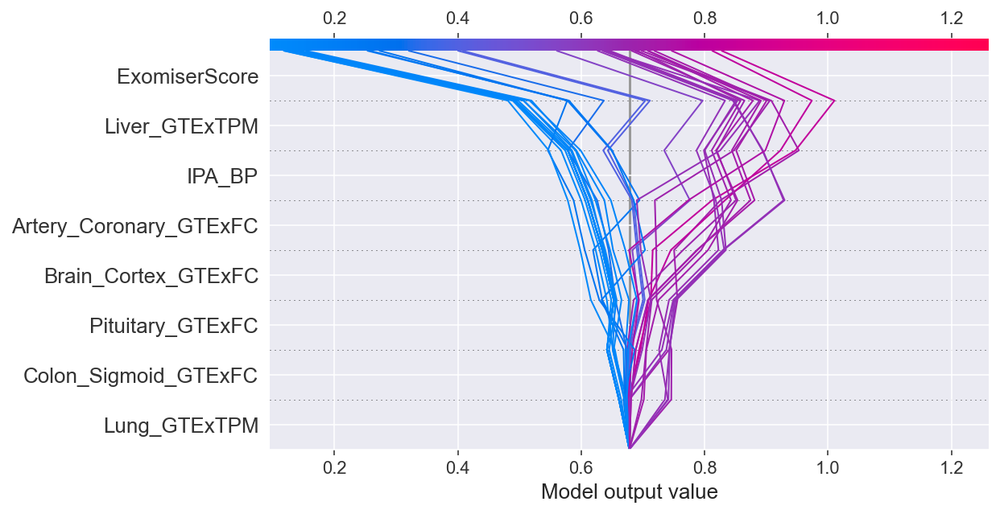

In [60]:
T = lowEx


with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

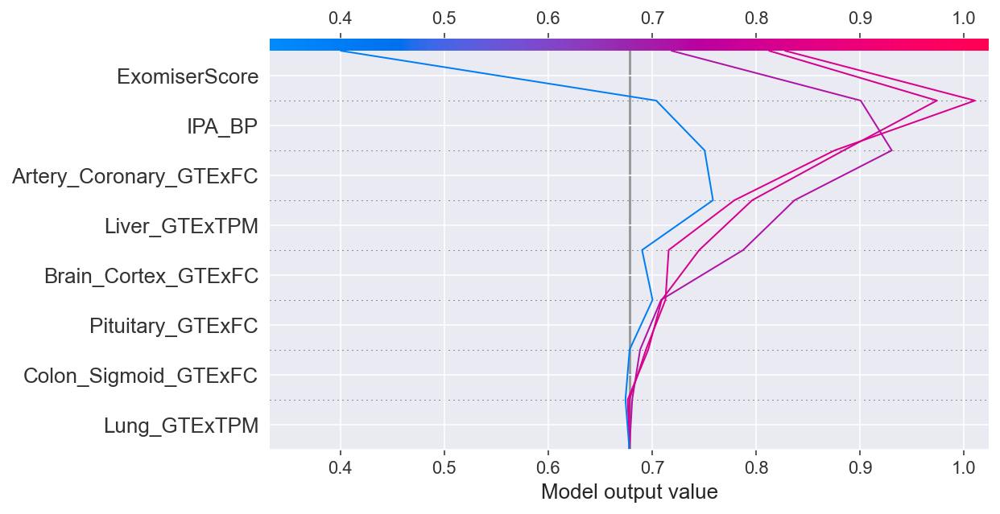

In [61]:
T = lowEx
T = T[(Y2 == 1.0)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

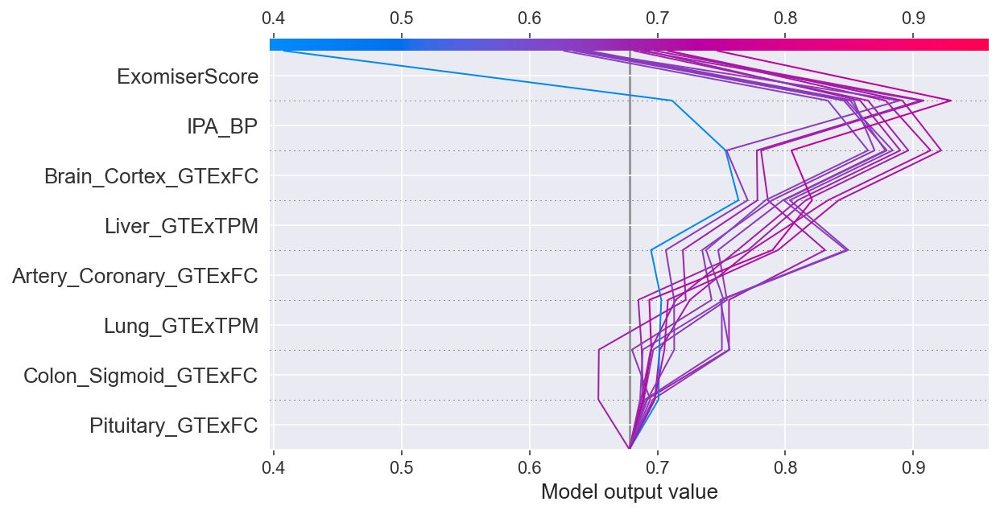

In [62]:
T = lowEx
T = T[(Y2 == 0.75)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

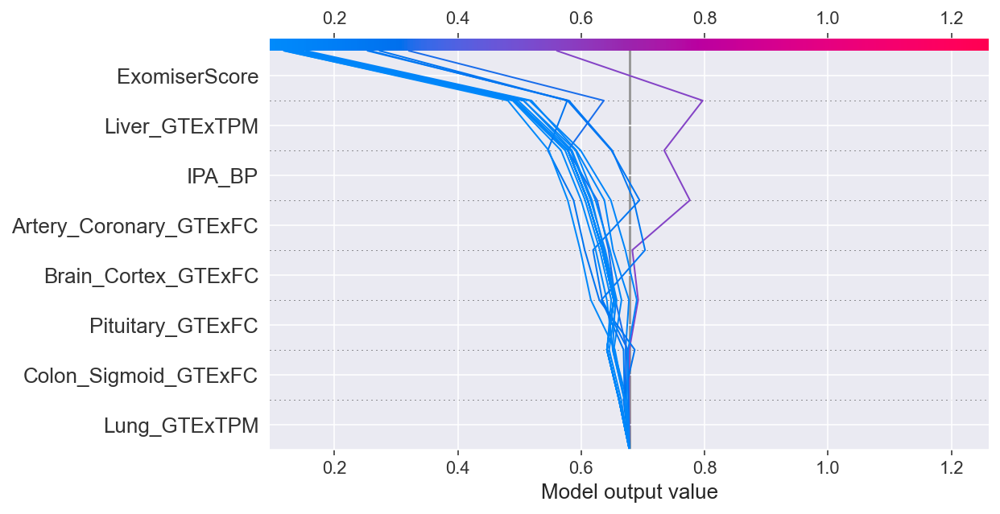

In [63]:
T = lowEx
T = T[(Y2 == 0.1)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

## Unknown Gene Prediction

In [14]:
dataset_unknown = pd.read_csv("2021-07-18_pval07_BP_unknown.txt", sep="\t")

df2 = dataset_unknown[
    [
        "Pituitary_GTExFC",
        "Lung_GTExTPM",
        "Liver_GTExTPM",
        "IPA_BP_annotation",
        "ExomiserScore",
        "Brain_Cortex_GTExFC",
        "Artery_Coronary_GTExFC",
        "Colon_Sigmoid_GTExFC",
    ]
]

df2.shape

(1804, 8)

In [15]:
imputer = MissForest(random_state=seed)
df3 = imputer.fit_transform(df2)

Iteration: 0
Iteration: 1
Iteration: 2


In [16]:
X2 = pd.DataFrame(df3, index=df2.index, columns=df2.columns)

X2.shape

(1804, 8)

In [17]:
model = xgb
model.fit(X_boruta_sel, Y)
predictions = list(model.predict(X2))

output = pd.Series(data=predictions, index=dataset_unknown.index, name="xgb_Score")

df_total = pd.concat([dataset_unknown, output], axis=1)

In [18]:
df_total.nlargest(10, "xgb_Score", keep="last")

,Gene,REVEL.max,MetaSVM_rankscore.max,MetaLR_rankscore.max,MCAP.max,minP.min.min,minP.min.max,wgEncodeBroadHmmHuvecHMM.count,betamax,logpval_gwascatalog,...,GTEx_signif_sexbias,HIPred,IPA_BP_annotation,IPA_Activity,O_GlcNAc_Score,EMS_Max,PharmGKB_Score,ExAc_constraint_obs_exp,BPlabel,xgb_Score
1714,VCL,NaN,NaN,NaN,NaN,NaN,NaN,525,-0.4716,12.000000,...,NaN,0.639468,1,2,NaN,NaN,NaN,0.304247,unknown,0.925563
561,GCH1,NaN,NaN,NaN,NaN,NaN,NaN,496,-0.3323,15.698970,...,NaN,0.824708,1,2,NaN,NaN,NaN,NaN,unknown,0.911683
459,EIF2AK4,0.088,0.430,0.0,NaN,NaN,NaN,859,0.4011,49.698970,...,1.0,0.708683,1,0,NaN,NaN,0.0,0.920901,unknown,0.909966
476,ERAP1,0.243,0.539,0.0,NaN,NaN,NaN,60,-0.3677,375.000000,...,NaN,0.167413,1,2,0.256505,NaN,NaN,NaN,unknown,0.908386
201,C1GALT1,NaN,NaN,NaN,NaN,NaN,NaN,45,-0.3187,28.000000,...,1.0,0.451622,1,2,NaN,NaN,NaN,NaN,unknown,0.907541
828,MLLT3,NaN,NaN,NaN,NaN,NaN,NaN,156,0.5430,12.698970,...,1.0,0.824708,1,0,NaN,NaN,0.0,0.168365,unknown,0.906908
1607,TLN1,NaN,NaN,NaN,NaN,NaN,NaN,945,-0.5041,21.301030,...,1.0,0.801729,1,2,14.477714,NaN,NaN,0.460352,unknown,0.903387
175,BMPR1B,NaN,NaN,NaN,NaN,NaN,NaN,467,0.3888,12.000000,...,NaN,0.852899,1,0,NaN,NaN,NaN,1.020019,unknown,0.902245
611,HDAC9,NaN,NaN,NaN,NaN,NaN,NaN,46,-0.2720,282.522879,...,1.0,0.602501,1,1,NaN,NaN,NaN,NaN,unknown,0.900501
678,INSR,NaN,NaN,NaN,NaN,NaN,NaN,233,0.4183,58.000000,...,1.0,0.743839,1,0,6.200085,NaN,0.0,NaN,unknown,0.900069


In [19]:
df_file = df_total[["Gene", "xgb_Score"]]
df_file = df_file.nlargest(1804, "xgb_Score", keep="last")

### Model Prediction Distribution:

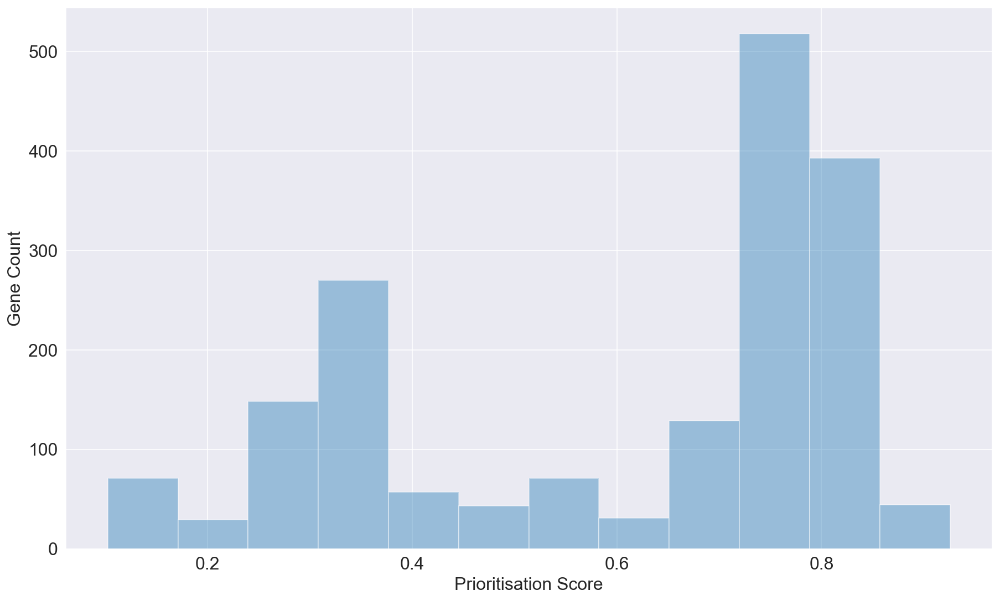

In [20]:
ax = sns.distplot(df_total["xgb_Score"], kde=False, norm_hist=False)
ax.set_xlabel("Prioritisation Score", fontsize=16)
ax.set_ylabel("Gene Count", fontsize=16)
ax.tick_params(labelsize=16)

### SHAP Feature Importance Visualization:

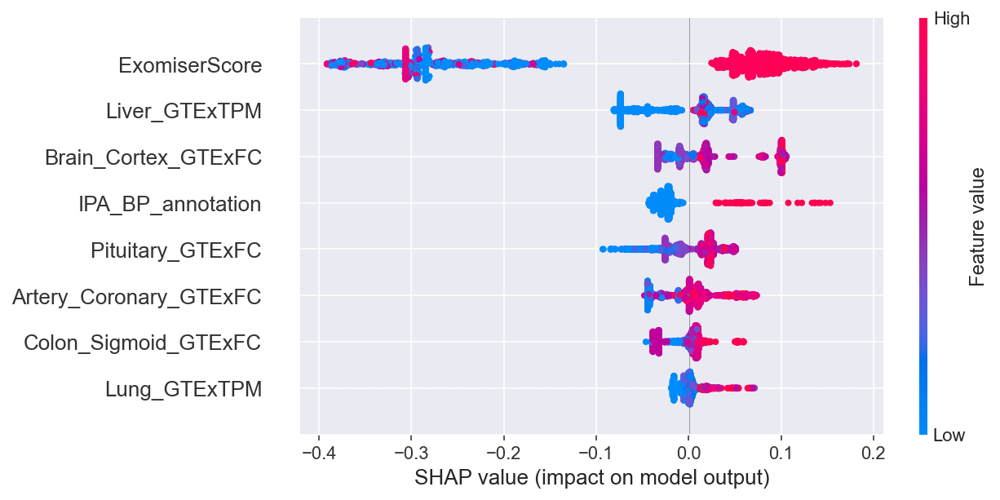

In [38]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X2)
shap.summary_plot(shap_values, X2)

In [39]:
expected_value = explainer.expected_value

In [43]:
select = range(8)
features = X2.iloc[select]
features_display = X2.loc[features.index]
shap_values = explainer.shap_values(X2)
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[:1804, :],
    X2.iloc[:1804, :],
    features_display,
)

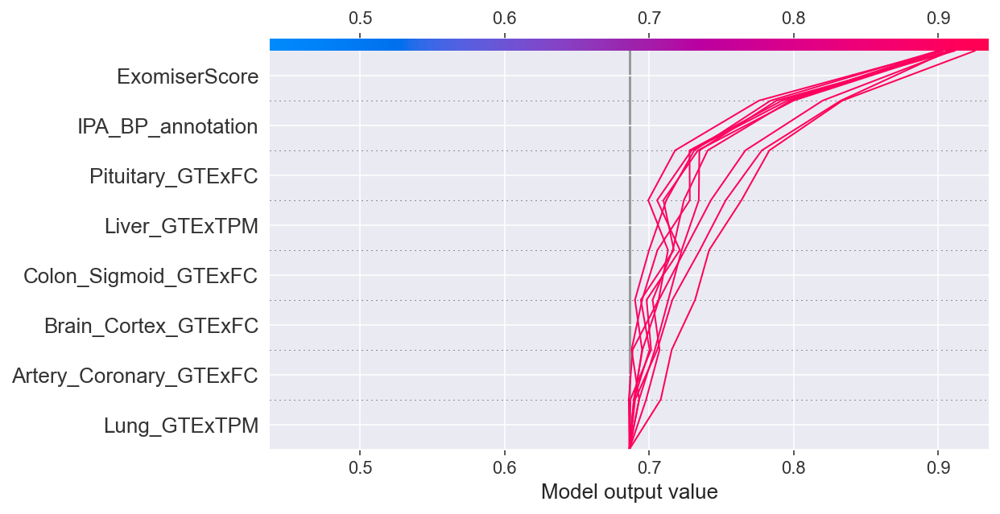

In [45]:
y_pred = model.predict(X2)

T = X2[(y_pred >= 0.900069)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [44]:
L=[1714, 561, 459, 476, 201, 828, 1607, 175, 611, 678]
X10 = X2.loc[L]

In [45]:
df10 = df_total.nlargest(10, "xgb_Score", keep="last")
df10 = df10 [[
        "Pituitary_GTExFC",
        "Lung_GTExTPM",
        "Liver_GTExTPM",
        "IPA_BP_annotation",
        "ExomiserScore",
        "Brain_Cortex_GTExFC",
        "Artery_Coronary_GTExFC",
        "Colon_Sigmoid_GTExFC",]]

In [46]:
select = range(8)
features = X10.iloc[select]
features_display = X10.loc[features.index]
shap_values = explainer.shap_values(X10)
shap.initjs()
shap.force_plot(
    explainer.expected_value,
    shap_values[:10, :],
    X10.iloc[:10, :],
    features_display,
)

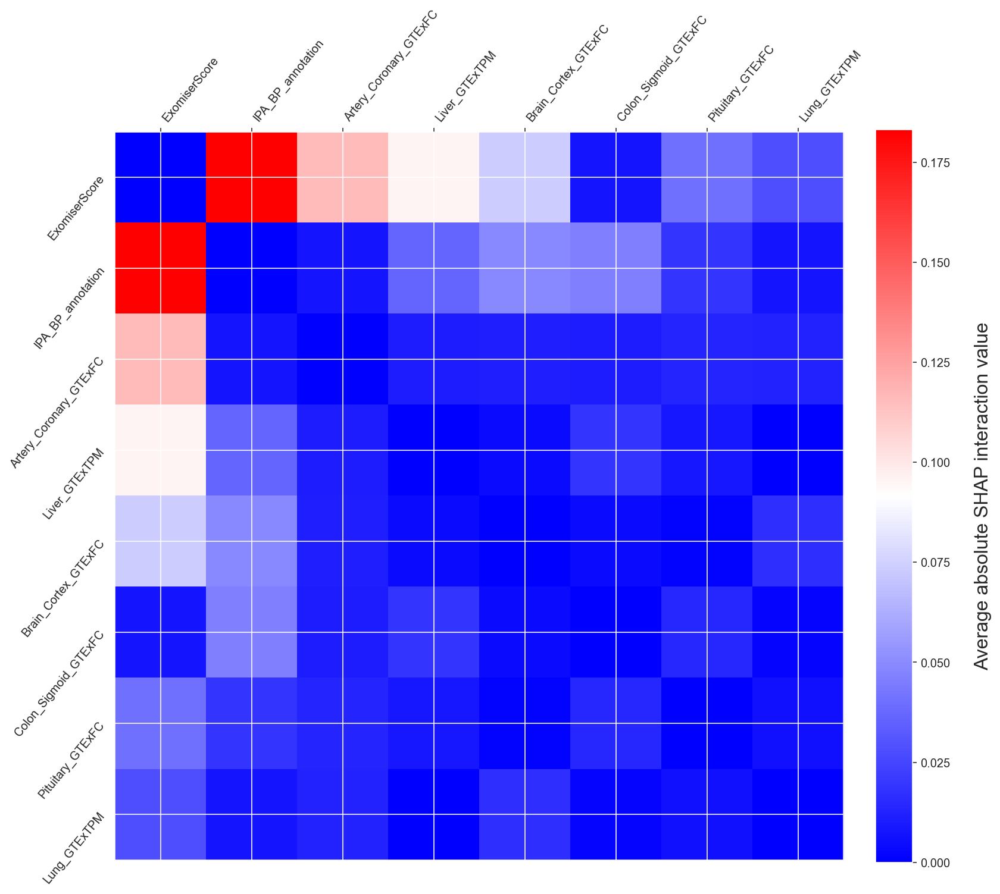

In [27]:
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(X10)
X_interaction10 = pd.DataFrame(data=X10, columns=df10.columns)


tmp = np.abs(shap_interaction_values).sum(0)
for i in range(tmp.shape[0]):
    tmp[i, i] = 0
inds = np.argsort(-tmp.sum(0))[:50]
tmp2 = tmp[inds, :][:, inds]
plt.figure(figsize=(12, 12))
plt.imshow(
    tmp2, cmap="bwr"
)  # https://matplotlib.org/stable/gallery/color/colormap_reference.html
plt.yticks(
    range(tmp2.shape[0]),
    X_interaction10.columns[inds],
    rotation=50.4,
    horizontalalignment="right",
)
plt.xticks(
    range(tmp2.shape[0]),
    X_interaction10.columns[inds],
    rotation=50.4,
    horizontalalignment="left",
)
plt.gca().xaxis.tick_top()
cbar = plt.colorbar(fraction=0.046, pad=0.04)
cbar.set_label("Average absolute SHAP interaction value", size=16, labelpad=20)
plt.rcParams.update({"font.size": 16})
plt.show()

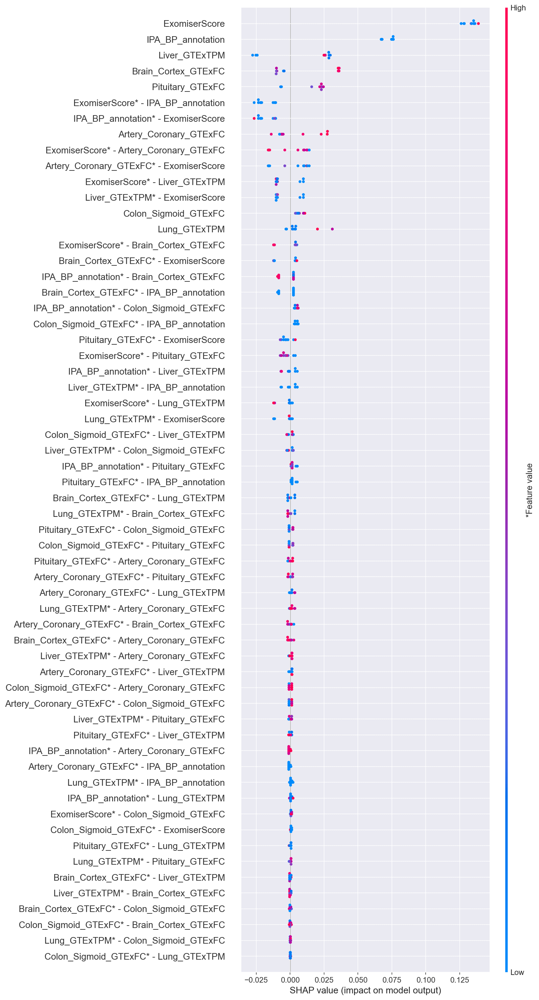

In [28]:
shap.summary_plot(
    shap_interaction_values, X10, max_display=60, plot_type="compact_dot"
)

In [29]:
shap.initjs()

# Write in a function
def shap_plot(j):
    explainerModel = shap.TreeExplainer(model)
    shap_values_Model = explainerModel.shap_values(X2)
    p = shap.force_plot(
        explainerModel.expected_value,
        shap_values_Model[j],
        X2.iloc[[j]],
        feature_names=df2.columns,
    )
    return p


shap_plot(1714)

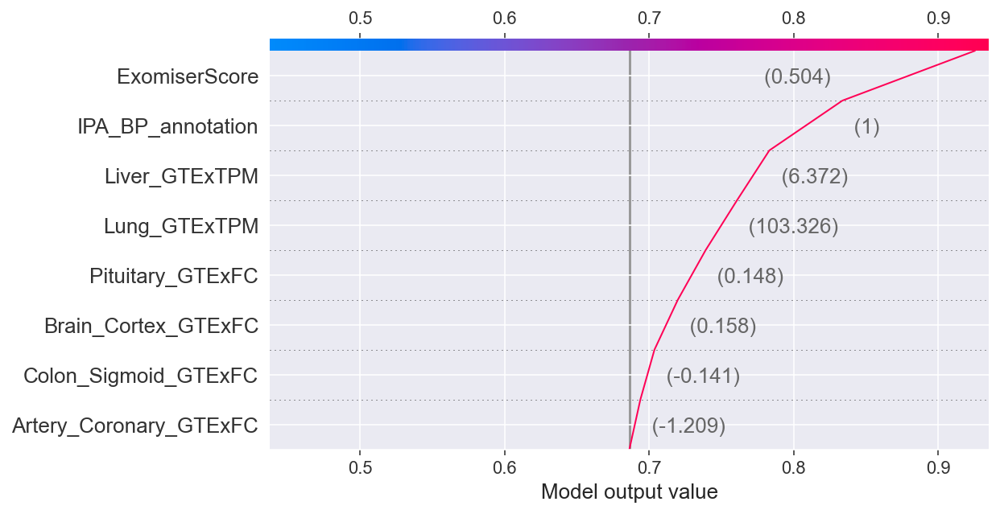

In [33]:
expected_value = explainer.expected_value
shap.decision_plot(expected_value, shap_values[1714], X2.iloc[1714])

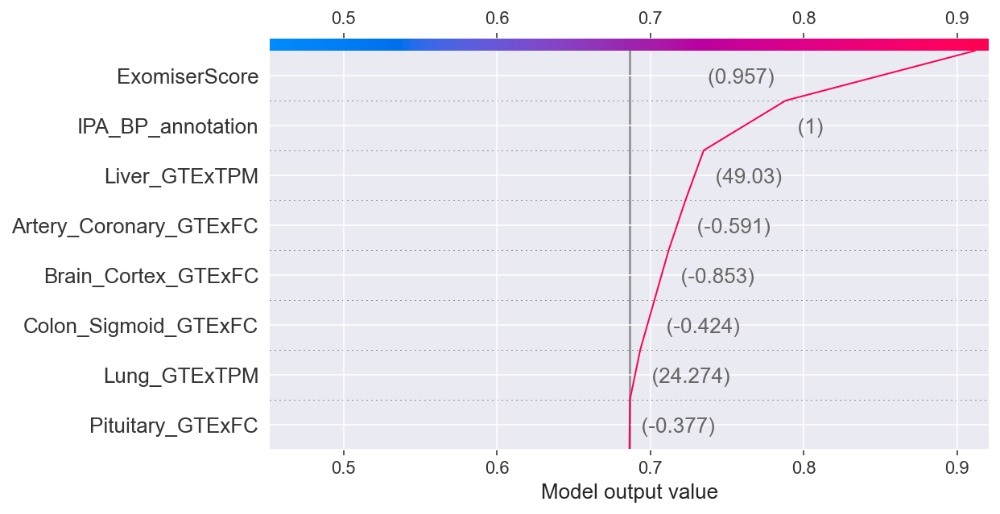

In [26]:
shap.decision_plot(expected_value, shap_values[561], X2.iloc[561])

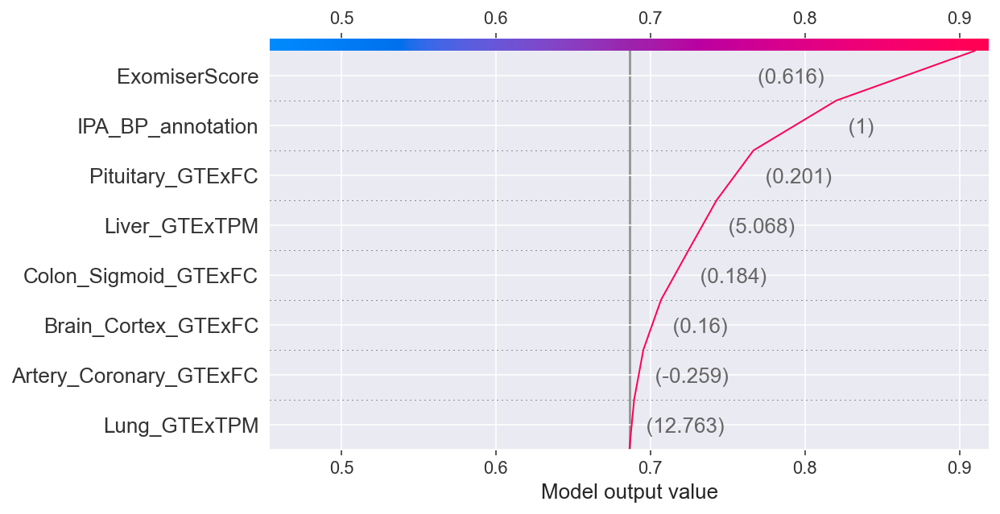

In [27]:
shap.decision_plot(expected_value, shap_values[459], X2.iloc[459])

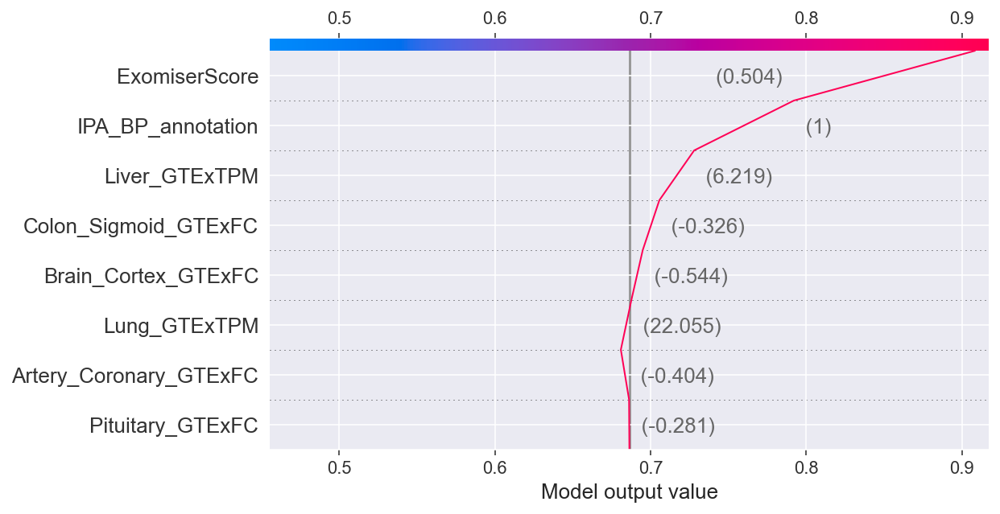

In [28]:
shap.decision_plot(expected_value, shap_values[476], X2.iloc[476])

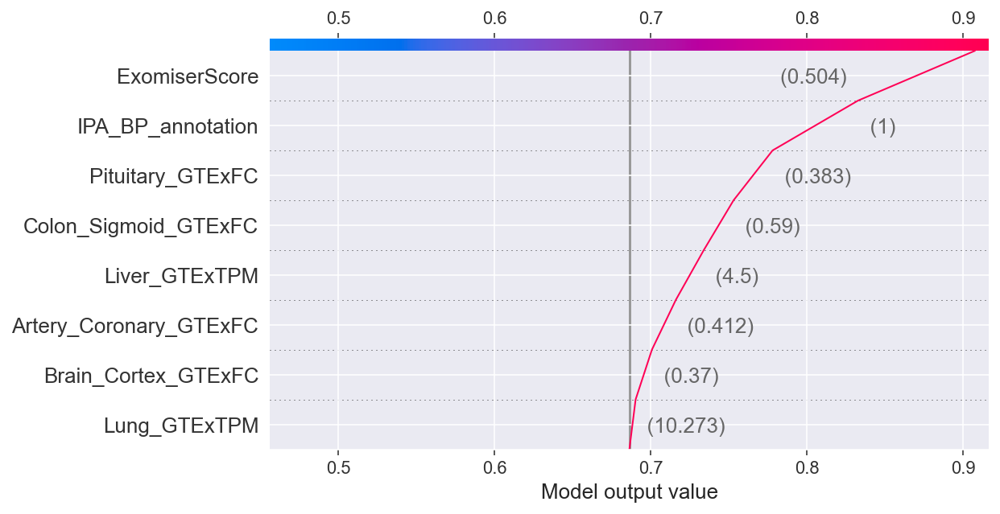

In [29]:
shap.decision_plot(expected_value, shap_values[201], X2.iloc[201])

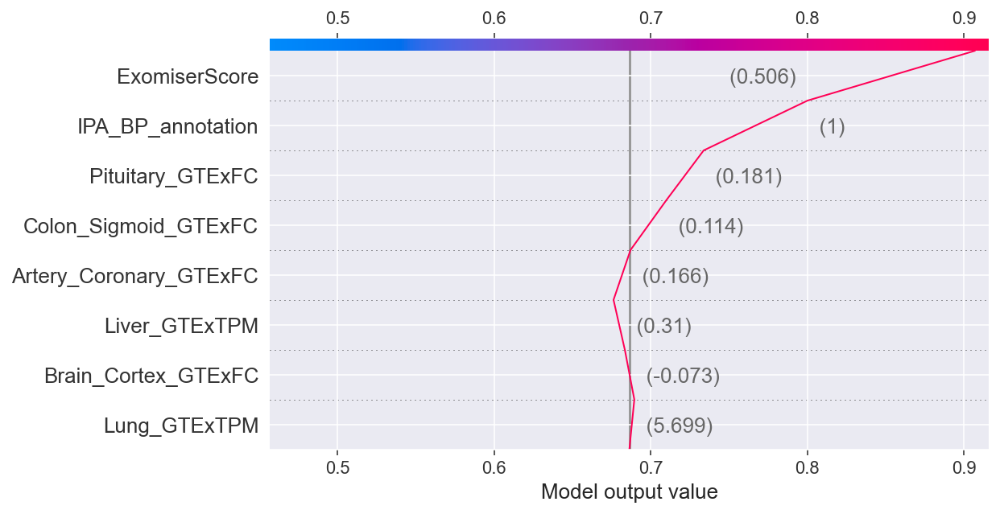

In [25]:
shap.decision_plot(expected_value, shap_values[828], X2.iloc[828])

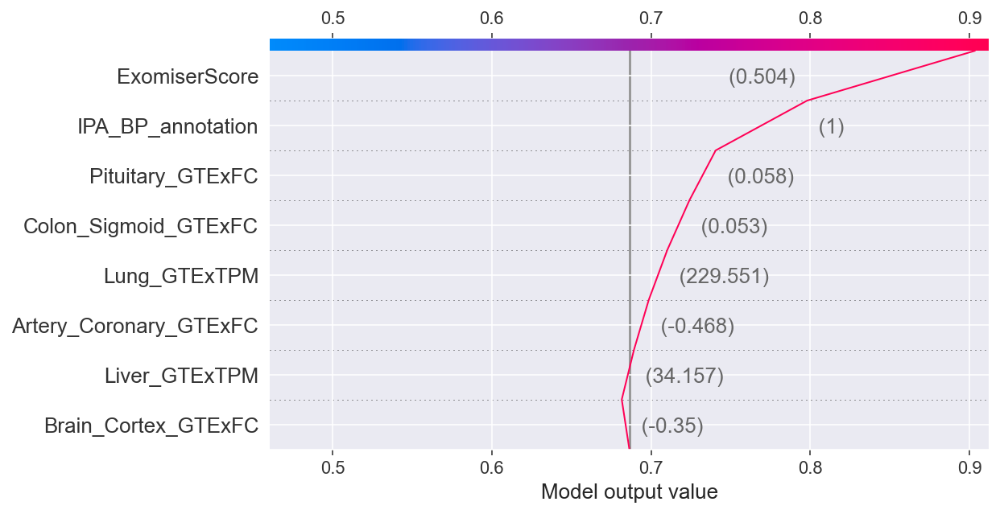

In [58]:
shap.decision_plot(expected_value, shap_values[1607], X2.iloc[1607])

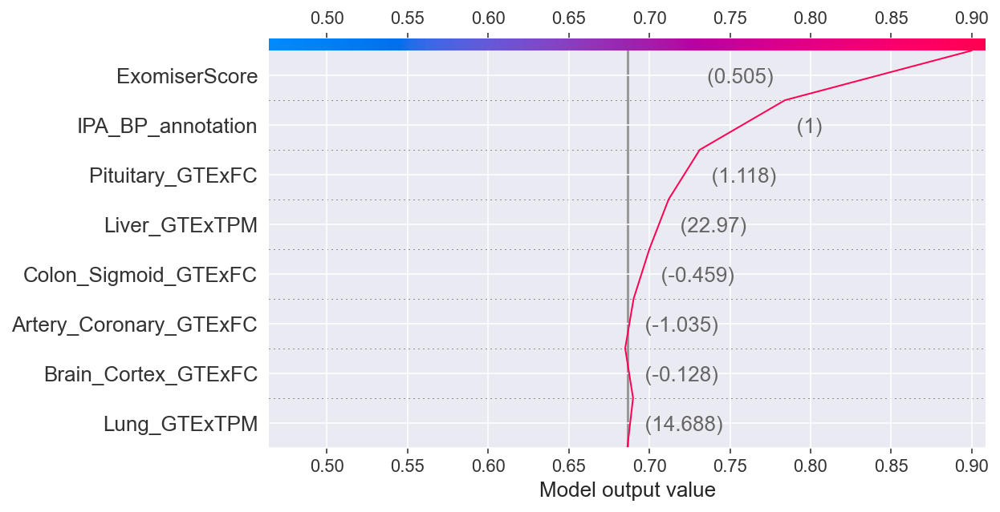

In [59]:
shap.decision_plot(expected_value, shap_values[678], X2.iloc[678])

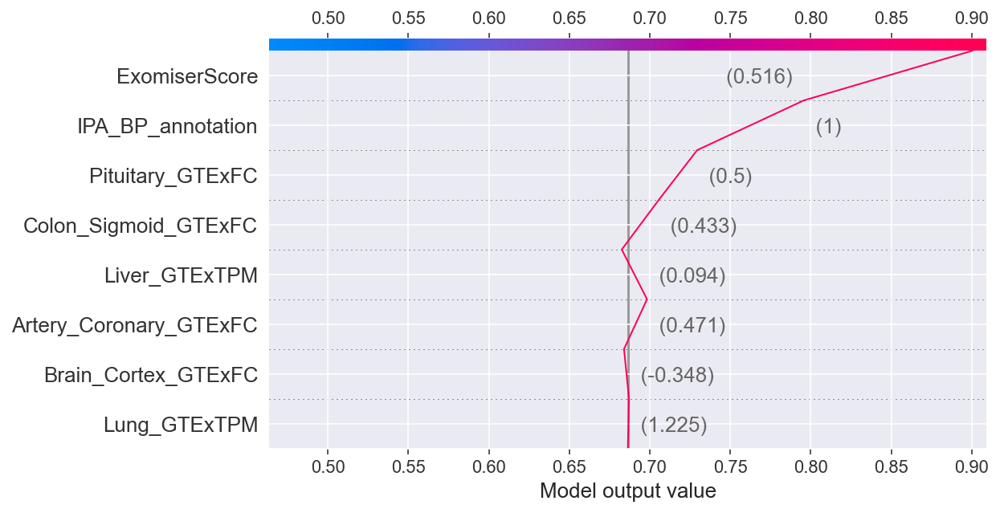

In [34]:
shap.decision_plot(expected_value, shap_values[611], X2.iloc[611])

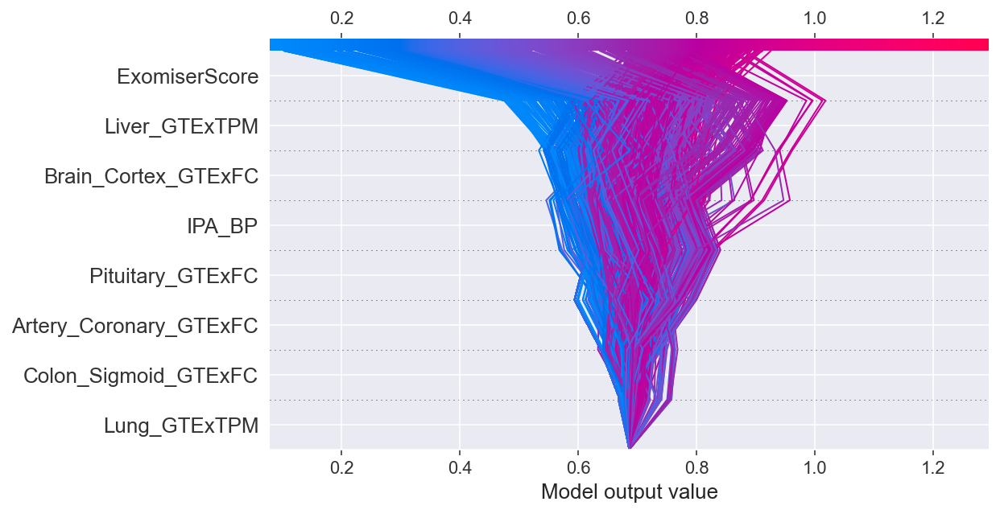

In [74]:
shap.decision_plot(expected_value, shap_values, X2)

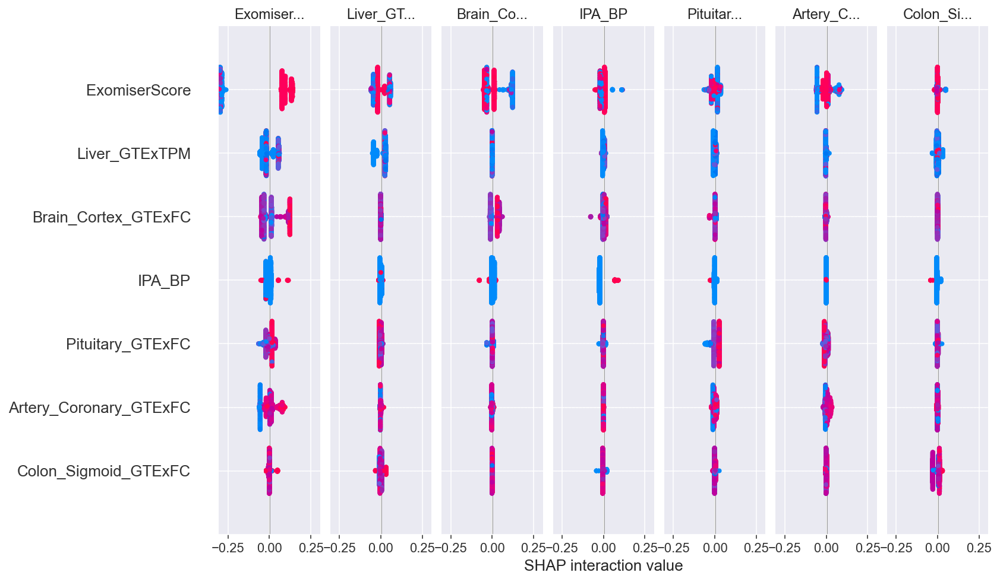

In [75]:
shap_interaction_values = shap.TreeExplainer(model).shap_interaction_values(X2)
X_interaction2 = pd.DataFrame(data=X2, columns=df2.columns)
shap.summary_plot(shap_interaction_values, X_interaction2)

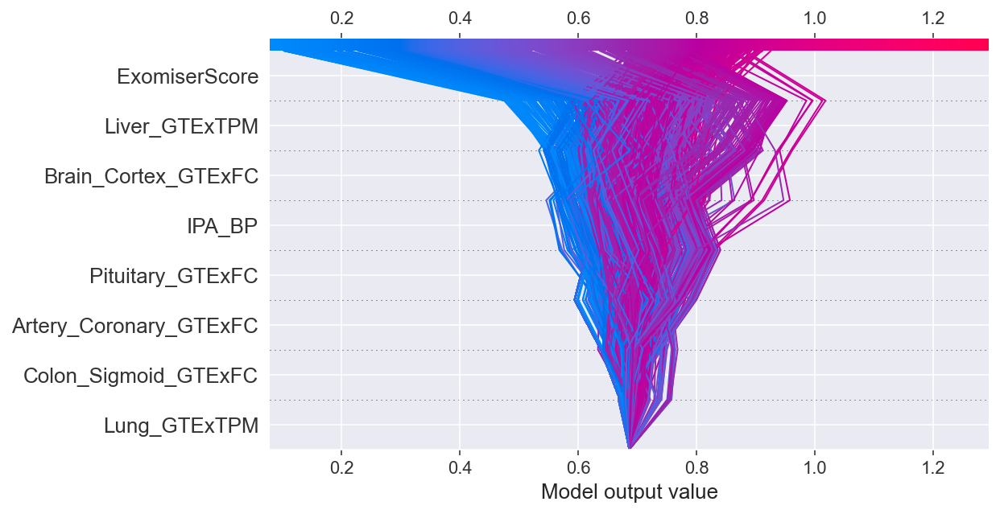

In [76]:
shap.decision_plot(expected_value, shap_values, features_display, ignore_warnings=True)

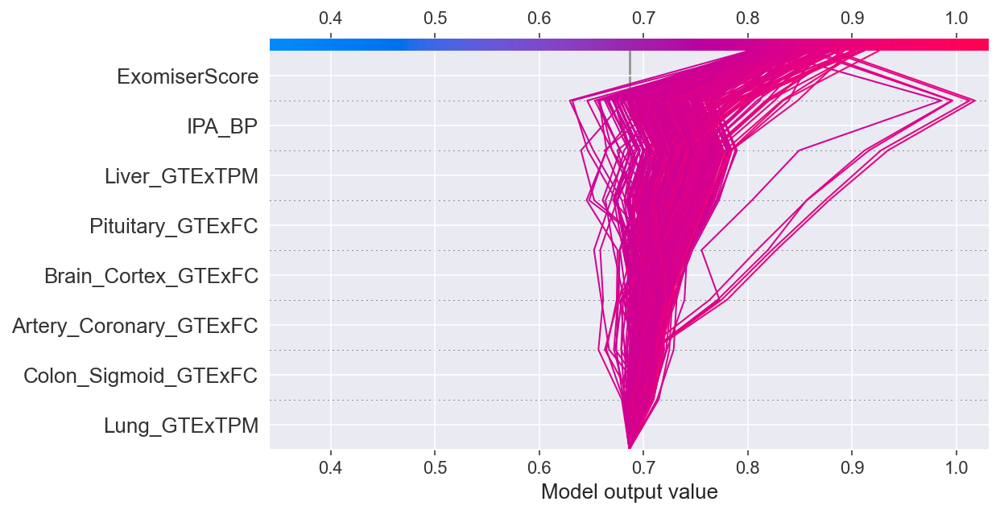

In [77]:
y_pred = xgb.predict(X2)
T = X2[(y_pred >= 0.8)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

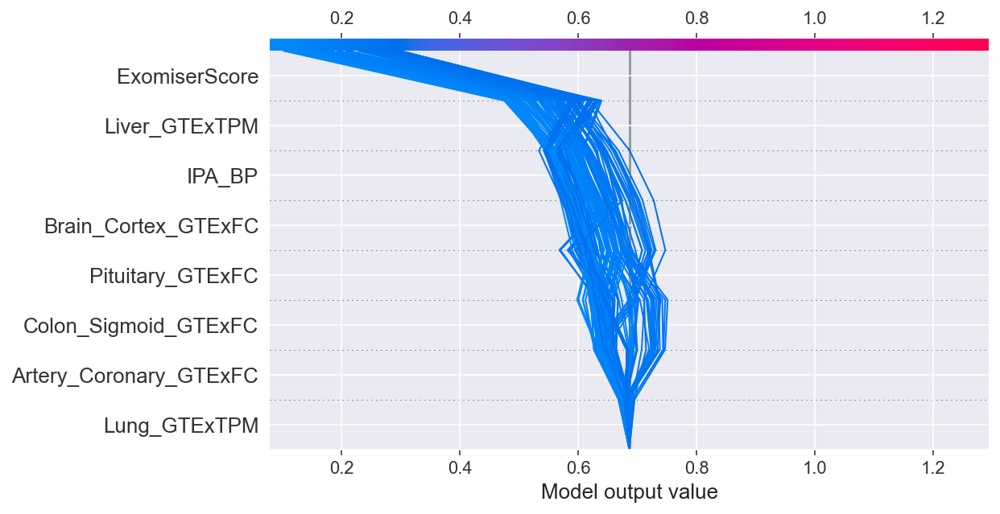

In [78]:
y_pred = xgb.predict(X2)
T = X2[(y_pred <= 0.3)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True, ignore_warnings=True)

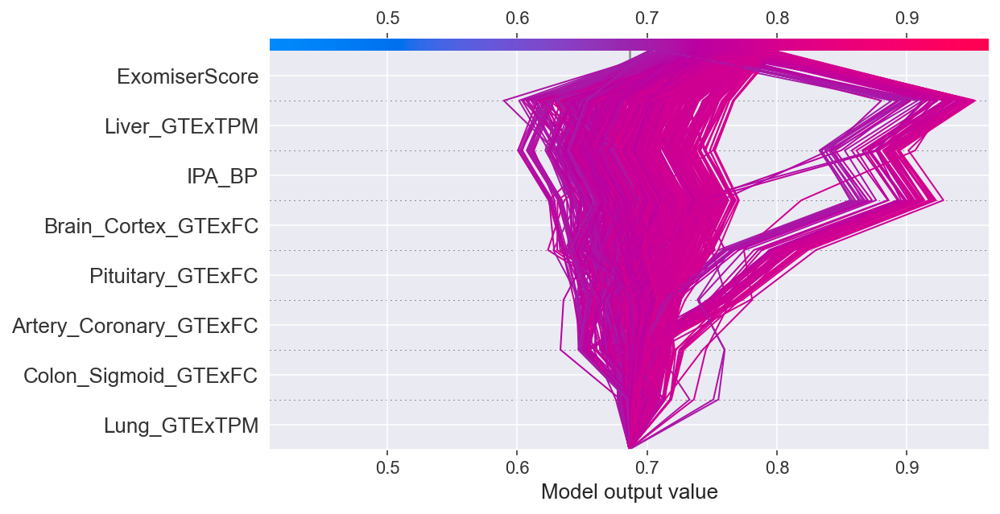

In [79]:
y_pred = xgb.predict(X2)
T = X2[(y_pred >= 0.7) & (y_pred <= 0.8)]

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sh = explainer.shap_values(T)
r = shap.decision_plot(expected_value, sh, T, return_objects=True)

In [76]:
smallest = df_total.nsmallest(10, "xgb_Score", keep="last")

smallest[['Gene', 'xgb_Score']]

,Gene,xgb_Score
1692,UFL1-AS1,0.102440
1316,RP11-382A20.7,0.102650
372,CTD-2033A16.3,0.102650
778,LY6G6F,0.103893
1320,RP11-432I5.2,0.104274
1360,RP11-734C14.2,0.104419
67,AGBL4,0.105703
1744,YBX1P6,0.107079
1403,RPS20P2,0.107079
1285,RP11-283G6.4,0.107079


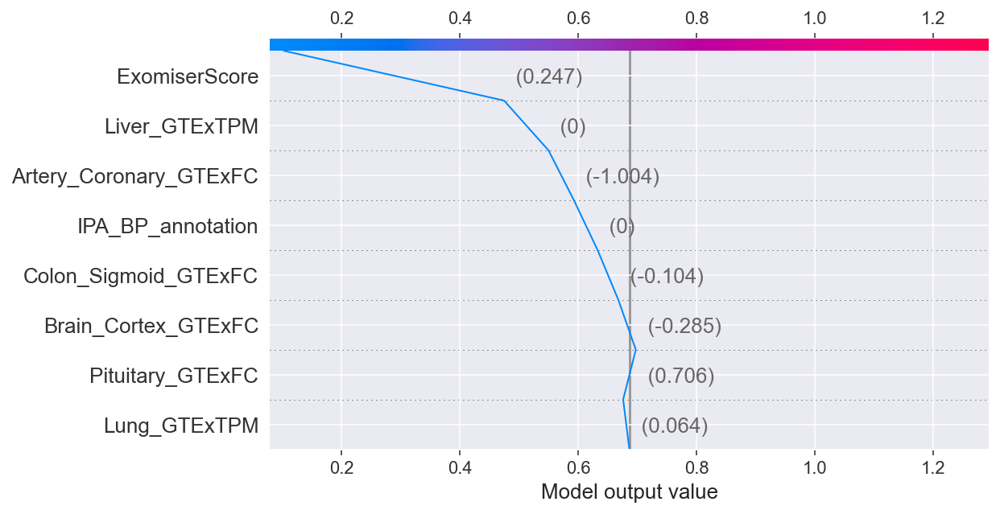

In [74]:
expected_value = explainer.expected_value
shap.decision_plot(expected_value, shap_values[1692], X2.iloc[1692])

In [82]:
gene1 = df_total[df_total["Gene"].str.contains("SUGCT")]
print(gene1)

       Gene  REVEL.max  MetaSVM_rankscore.max  MetaLR_rankscore.max  MCAP.max  \
1561  SUGCT       0.08                    NaN                   NaN       NaN   

      minP.min.min  minP.min.max  wgEncodeBroadHmmHuvecHMM.count  betamax  \
1561           NaN           NaN                             153  -0.6445   

      logpval_gwascatalog  ...  GTEx_signif_sexbias    HIPred  IPA_BP  \
1561                 24.0  ...                  1.0  0.195843       0   

      IPA_Activity  O_GlcNAc_Score  EMS_Max  PharmGKB_Score  \
1561             0             NaN      NaN             2.5   

      ExAc_constraint_obs_exp  BPlabel  xgb_Score  
1561                      NaN  unknown   0.826467  

[1 rows x 143 columns]


In [83]:
X_importance = X2
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_importance)

shap.initjs()

# Write in a function
def shap_plot(j):
    explainerModel = shap.TreeExplainer(model)
    shap_values_Model = explainerModel.shap_values(X2)
    p = shap.force_plot(
        explainerModel.expected_value,
        shap_values_Model[j],
        X2.iloc[[j]],
        feature_names=df2.columns,
    )
    return p


shap_plot(1561)

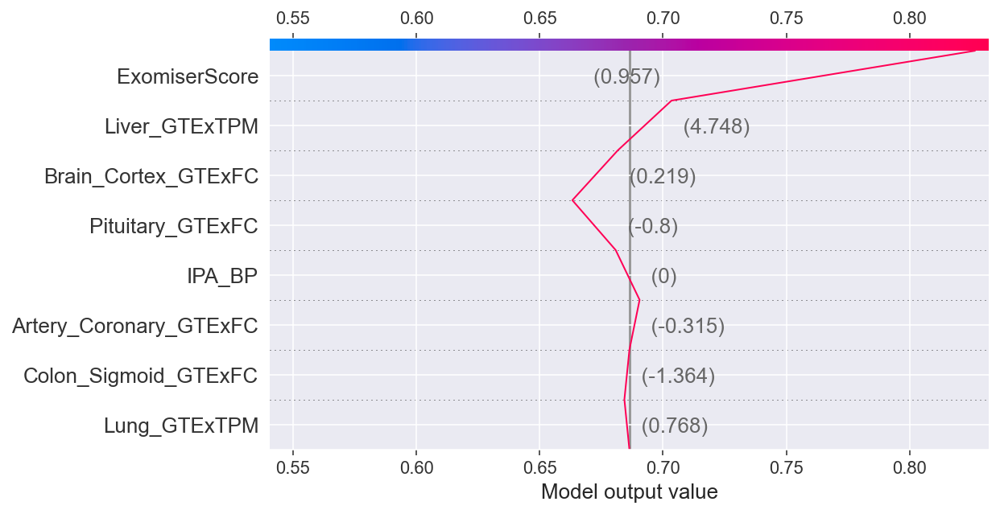

In [84]:
explainer = shap.TreeExplainer(model)

expected_value = explainer.expected_value
select = range(8)
features = X2.iloc[select]
features_display = X2.loc[features.index]
shap_values = explainer.shap_values(X2)
shap.decision_plot(
    expected_value, shap_values[1561], X2.iloc[1561], list(features_display)
)